# Lane finding on roads using traditional CV techniques
## Process overview
    1. Undistorted Image: Undistort the image using camera matrix and distortion co-efficients. 
    2. Binary Image: Convert the image to HLS space, threshold L (intensity) and S (color) and combine these to create a binary image
    3. Perpective Transformed Image: Transform the image to the birds eye view using perspective transform
    4. Lane Pixels: Get the pixels for left and right curves in the image by finding lane boundary
    5. Curvature: Fit the pixels corresponding to lanes to a second degree polynomial. Determine lane curvature, vehicle position w.r.t center of image. 
    6. Back to original view: transform bird eye view image to camera view image
    7. Visualization: Visualize pixels in the road boundary
    

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
%matplotlib inline

#### Helper function to visualize multiple images

In [2]:
def visualize_images(input_images, num_cols, figure_name, cmap = None):
    "Shows input images by stacking them in num_cols columns"
    fig, axes = plt.subplots((int)((len(input_images) + 1) /num_cols), num_cols, figsize=(24, 20))

    fig = plt.gcf()
    fig.canvas.set_window_title(figure_name)
    
    print(figure_name)
    
    for ax, image in zip(axes.flat, input_images):
        if(image.shape[2]==1):
            ax.imshow(image[:,:,0], cmap = cmap)
        else:
            ax.imshow(image, cmap=cmap)

    plt.show()

#### Read and visualize the test images

Read 8 images from ../data/test_images/ folder
Image shape =  (720, 1280, 3)
input_images


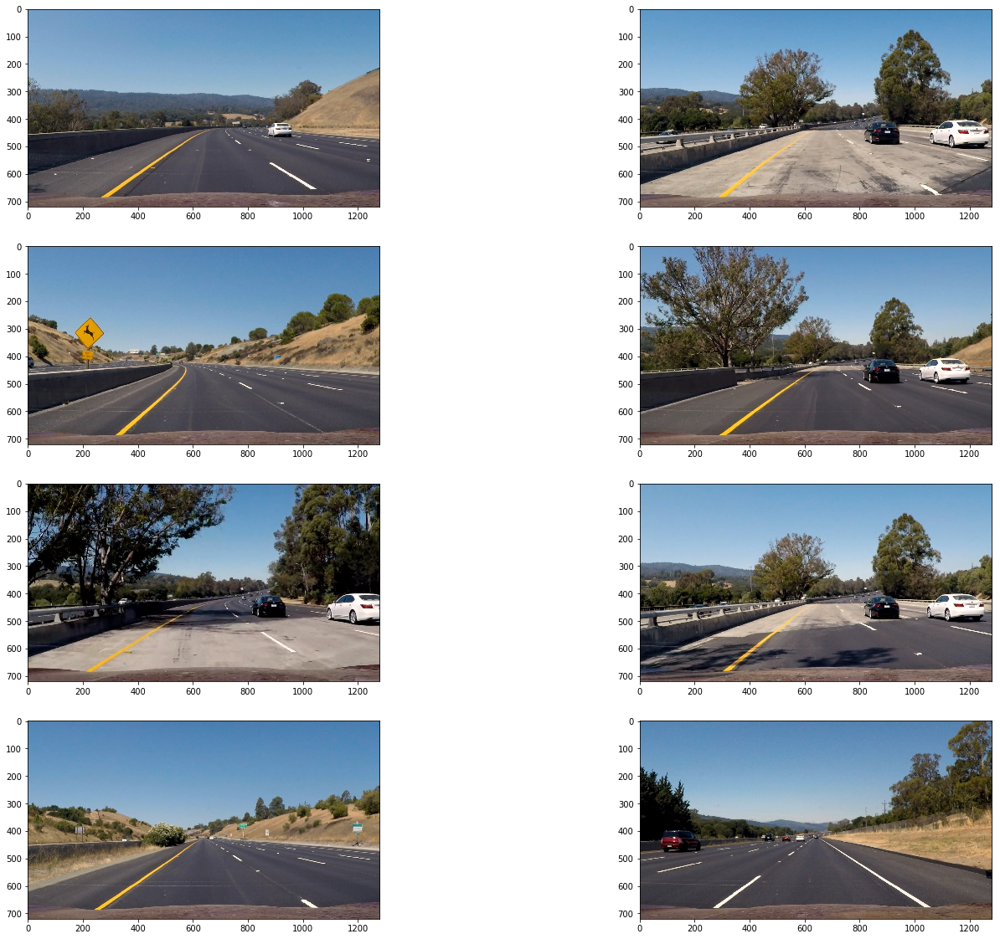

In [3]:
import glob

#path for the test imgaes
data_path = "../data/test_images/"

images_names = glob.glob(data_path + '*.jpg')

#List to store all input images
input_images = []

for idx, fname in enumerate(images_names):
    input_images.append(cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB))

print("Read %d images from %s folder" % (len(images_names), data_path))

image_shape = input_images[0].shape
print("Image shape = ", image_shape)
visualize_images(input_images, 2, "input_images")

## Step 1. Undistort all the read images
The code uses the camera matrix and distortion co-efficient from the pickle file
CameraCalibration.py file is used to create this pickle file

Undistorted images


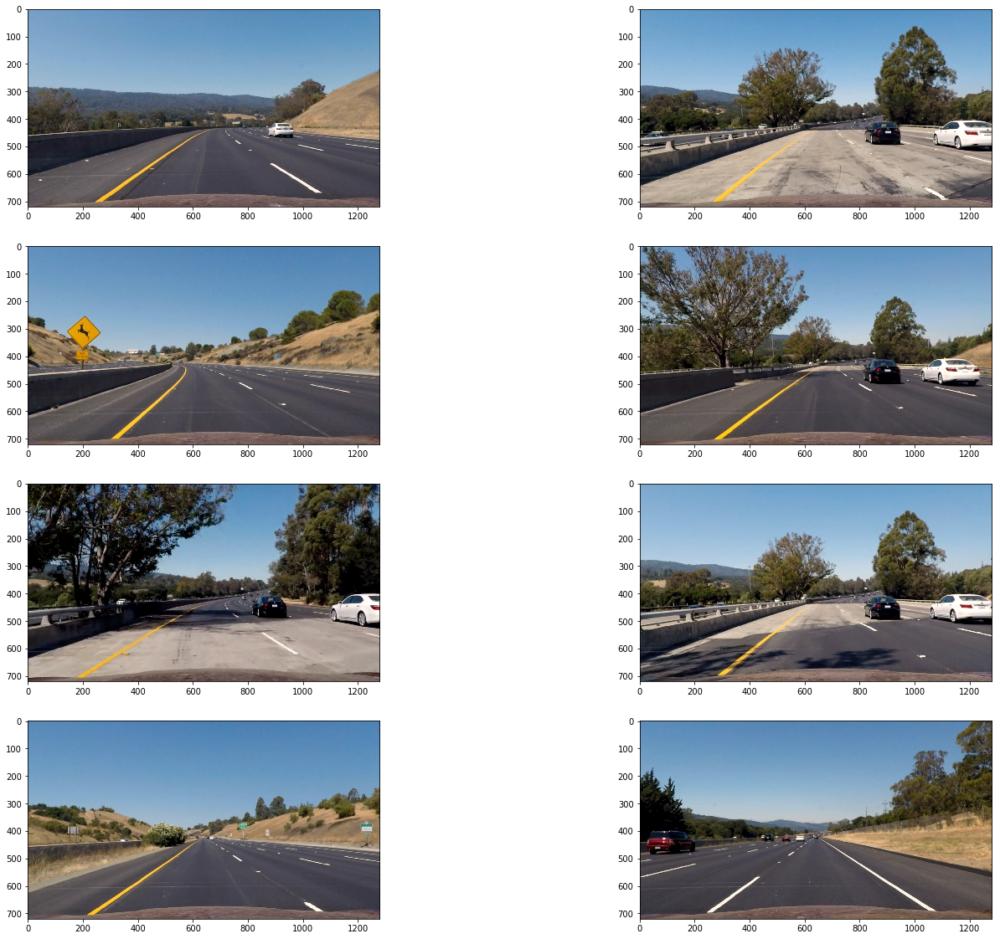

In [4]:
import pickle

# Path to Camera calibration pickle file
camera_cal_file = "../results/camera_cal/camera_dist_pickle.p"

# Read in the saved objpoints and imgpoints
cal_pickle = pickle.load( open(camera_cal_file, "rb" ) )
mtx = cal_pickle["mtx"]
dist = cal_pickle["dist"]

#Undistort all input images
undistorted_images = []
for image in input_images:
    undistorted_images.append(cv2.undistort(image, mtx, dist, None, mtx))

#Visualize undistorted images
visualize_images(undistorted_images, 2, "Undistorted images")

## Step 2. Get binary image
### Convert the image to HLS space, threshold L (intensity) and S (color) and combine these to create a binary image

color_binary_image is used only to help us visualize the results from thresholding

Result from black_binary_image is the result of this step

In [5]:
def color_binary_image(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    """
    Function takes is an RGB image, thresholds the images on lchannel (here we detect edges in x direction on intensity)
    and s channel (color). 
    Returns three channel image [zeros, lchannel_edges, color_threshold]. Dimension is same as the input image
    """
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary
    

In [6]:
def black_binary_image(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    """
    Function takes is an RGB image, thresholds the images on lchannel (here we detect edges in x direction on intensity)
    and s channel (color). 
    Returns one channel image [lchannel_edges | color_threshold] by combining both color and intersity results
    """
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    black_binary = np.zeros_like(s_channel)
    black_binary[(sxbinary > 0) | (s_binary > 0)] = 1
    black_binary = black_binary.reshape(img.shape[0], img.shape[1], 1) * 255
    return black_binary

Color binary images


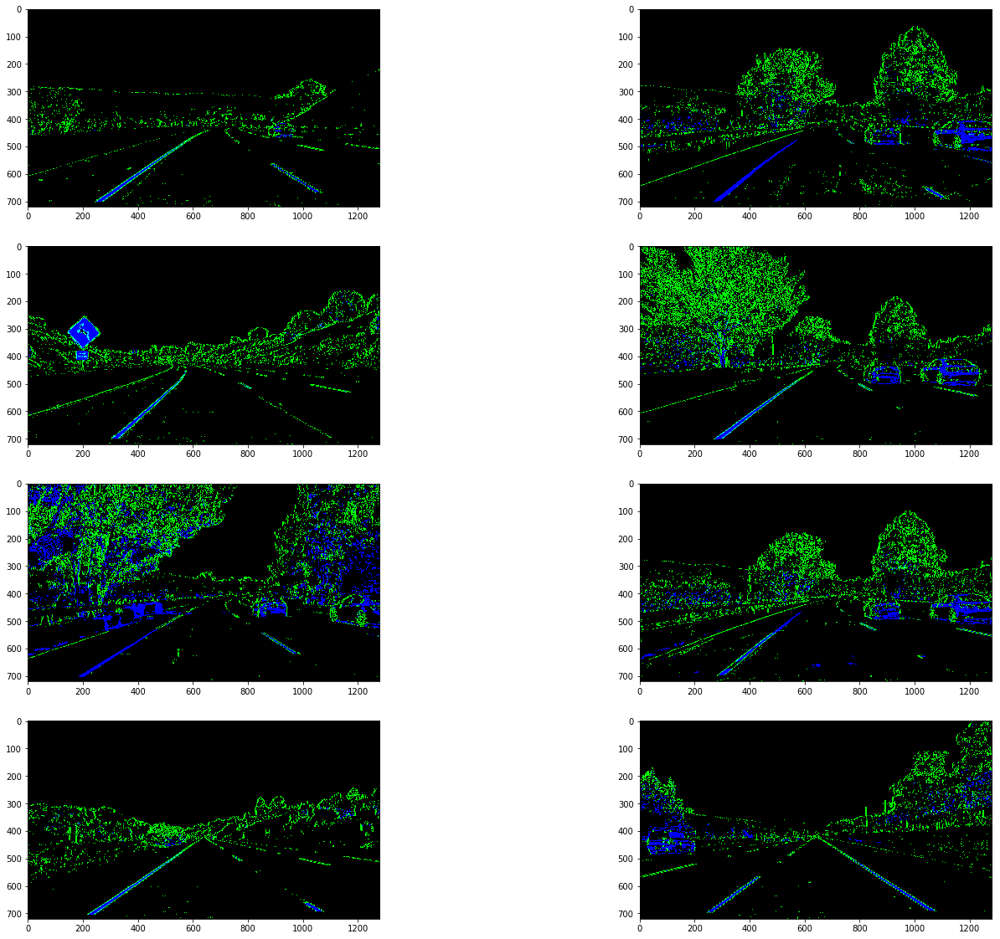

In [7]:
#Convert to color binary images and visualize

color_binary_images = np.zeros_like(undistorted_images)
for index, image in enumerate(undistorted_images):
    color_binary_images[index] = color_binary_image(image) 
    
#Vislualize color binary images    
visualize_images(color_binary_images, 2, "Color binary images")

Black binary images


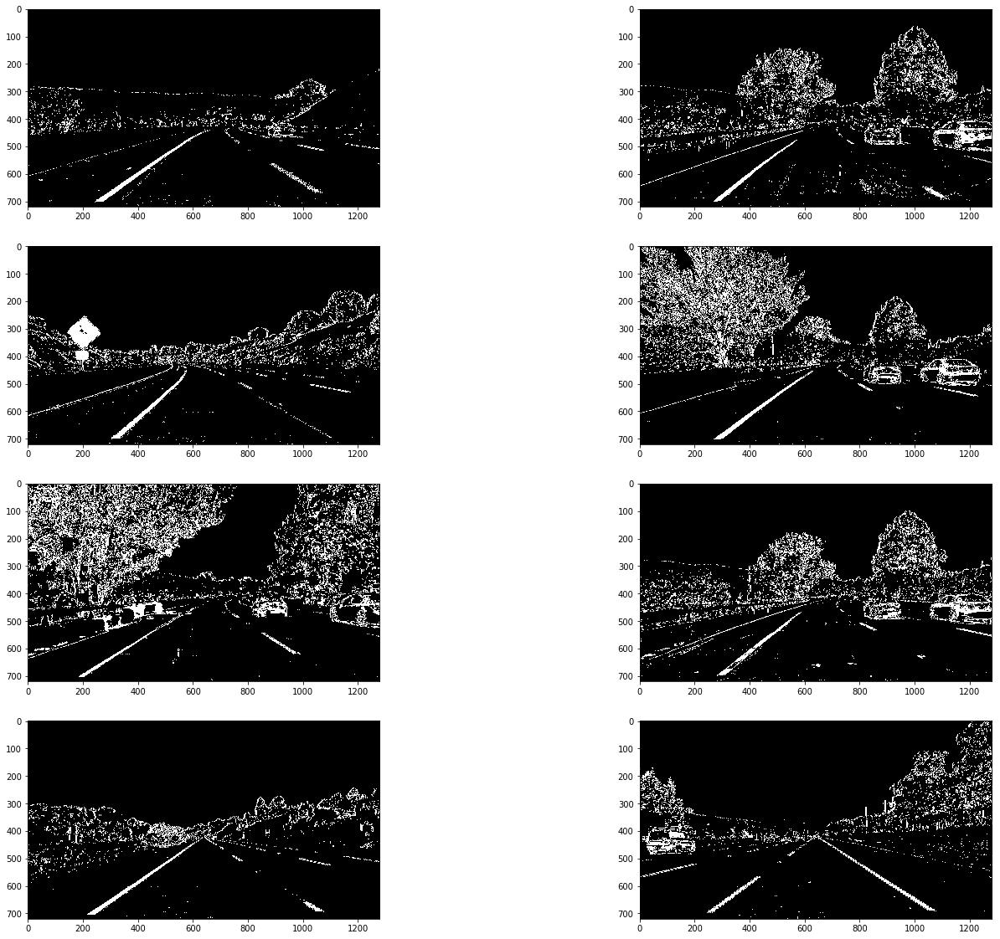

In [8]:
#Convert to black binary images and visualize
   
black_binary_images = np.zeros((len(undistorted_images), image_shape[0], image_shape[1], 1))

for index, image in enumerate(undistorted_images):
    black_binary_images[index] = black_binary_image(image) 

#Visualize black binary images
visualize_images(black_binary_images, 2, "Black binary images", cmap='Greys_r')

### Step 3. Perpective Transform
Transform the image to the birds eye view using perspective transform
1. Define source vertices (Take 4 points (2 on each lane) on the camera image which has straight lines). Here the image at last low and first column was used to define these points)
2. Define destination vertices (These line in src images appear to insersect when extrapolated but in dst images they should be parallel)
3. Transform the images using src and dst vertices

In [9]:
def perspective_transform(img, src_vertices, dst_vertices):
    """
    Funtion takes image, src and destination vertices and returns transformed image
    """
    M = cv2.getPerspectiveTransform(src_vertices, dst_vertices)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    return warped, M

In [10]:
#Define src and dst vertices 

src_vertices_roi = np.float32([(575, 460), (190 ,image_shape[0]), (1125, image_shape[0]), (710, 460)])
offset = 190
dst_vertices_roi = np.float32([[offset, 0], [offset, image_shape[0]], 
                                     [image_shape[1]-offset, image_shape[0]], 
                                     [image_shape[1]-offset, 0]])

src points on original image


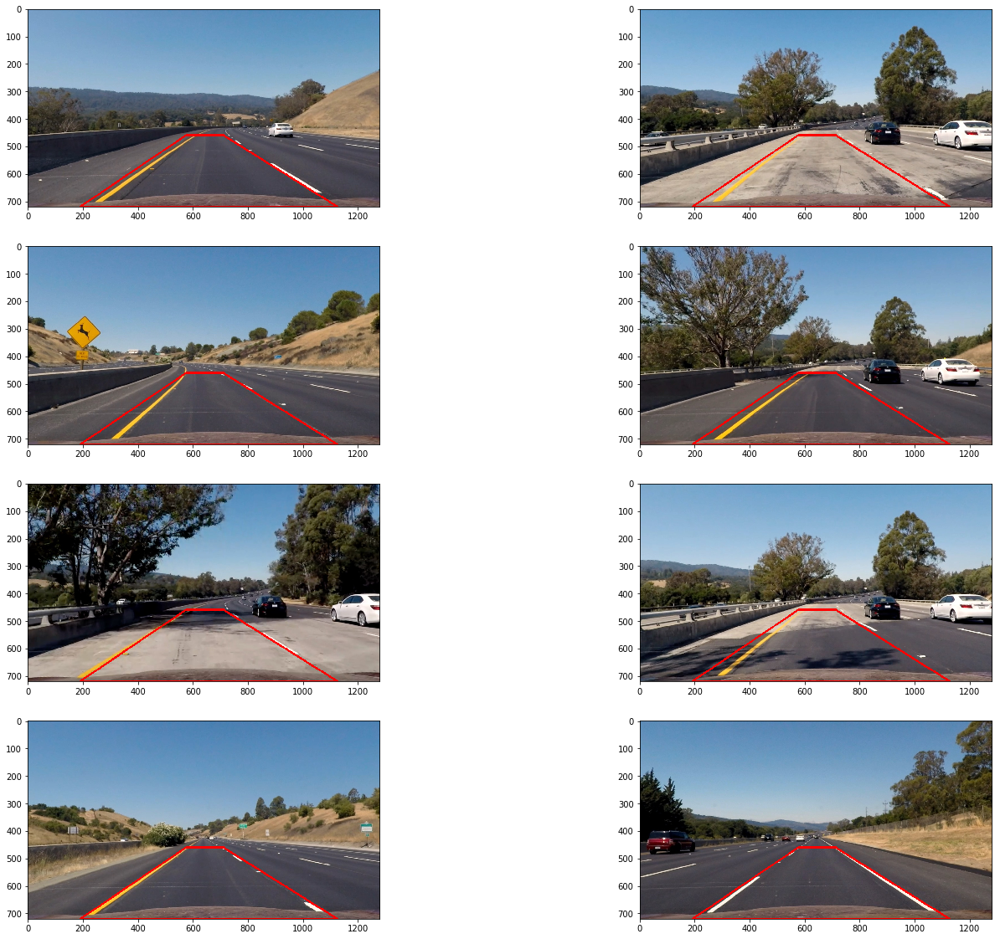

In [11]:
#Visualize source vertices on undistorted image

vis_roi = np.copy(undistorted_images)
for index, image in enumerate(vis_roi):
    cv2.polylines(image,[src_vertices_roi.reshape(-1,1,2).astype(int)], True,
                                   color = (255,0,0), thickness=5)
visualize_images(vis_roi, 2, "src points on original image")

perspective transformed color images


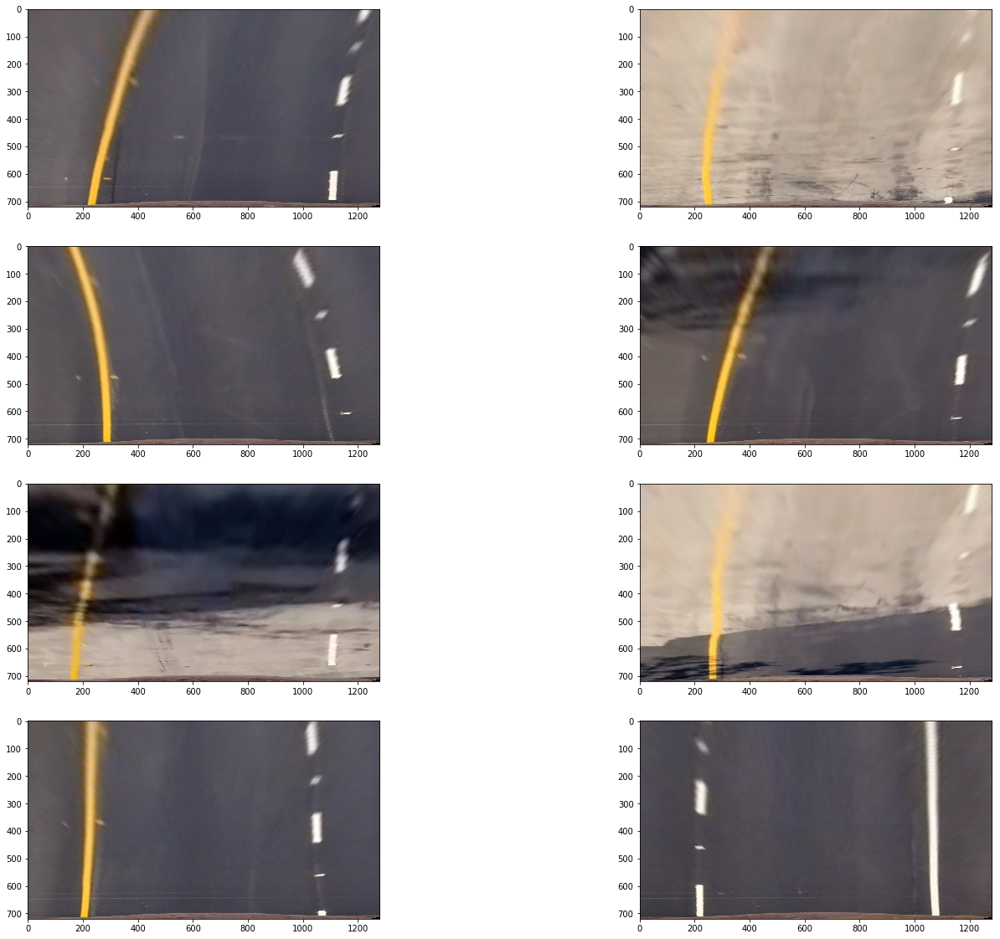

In [12]:
# Transform visualize transformation on undistorted color images
#We also need to save the transformation matrix to dewarp images again in the 

ptransformed_undist_images = np.zeros_like(undistorted_images)
ptransformed_M = []

for index, image in enumerate(undistorted_images):
    ptransformed_undist_images[index], perspective_M = perspective_transform(image, src_vertices_roi, dst_vertices_roi)
    ptransformed_M.append(perspective_M)
    
ptransformed_M = np.asarray(ptransformed_M)
    
visualize_images(ptransformed_undist_images, 2, "perspective transformed color images")

perspective transformed color binary images


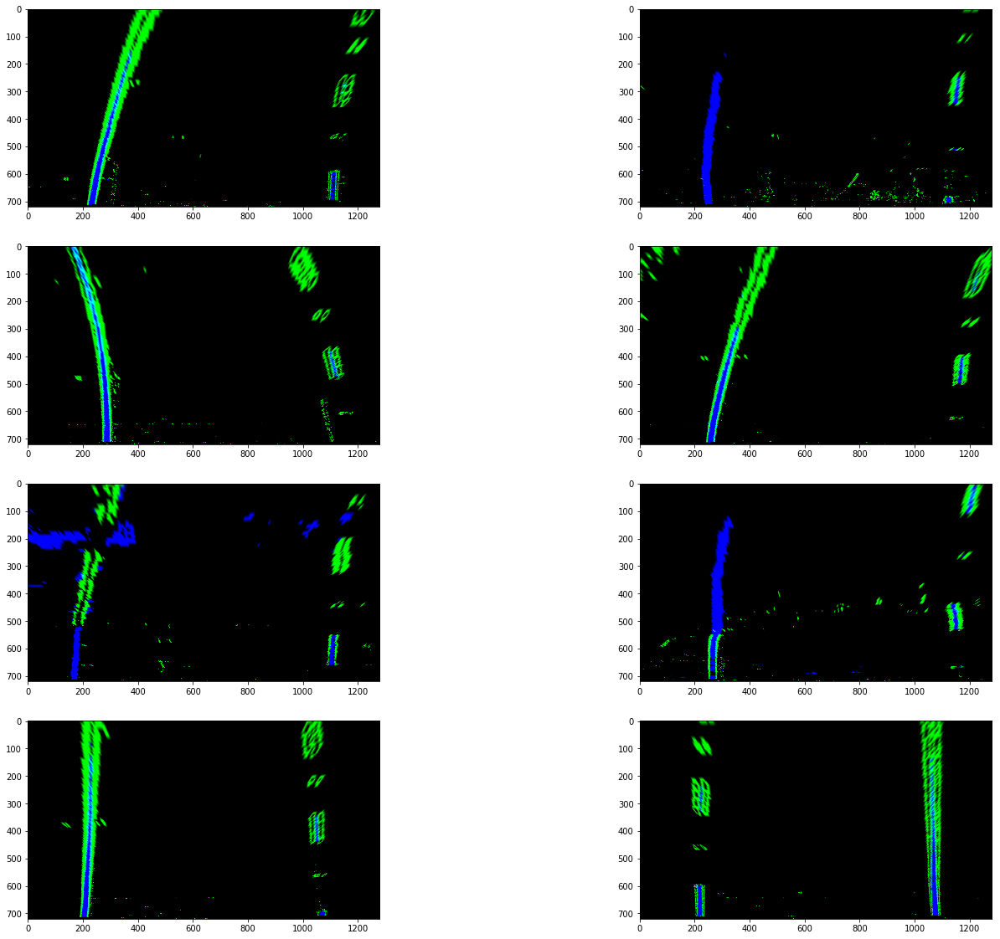

In [13]:
# Transform and visualize transformation on color binary images

ptransformed_color_binary_images = np.zeros_like(color_binary_images)

for index, image in enumerate(color_binary_images):
    ptransformed_color_binary_images[index], perspective_M = perspective_transform(image, src_vertices_roi, dst_vertices_roi)    

visualize_images(ptransformed_color_binary_images, 2, "perspective transformed color binary images")

perspective transformed black binary images


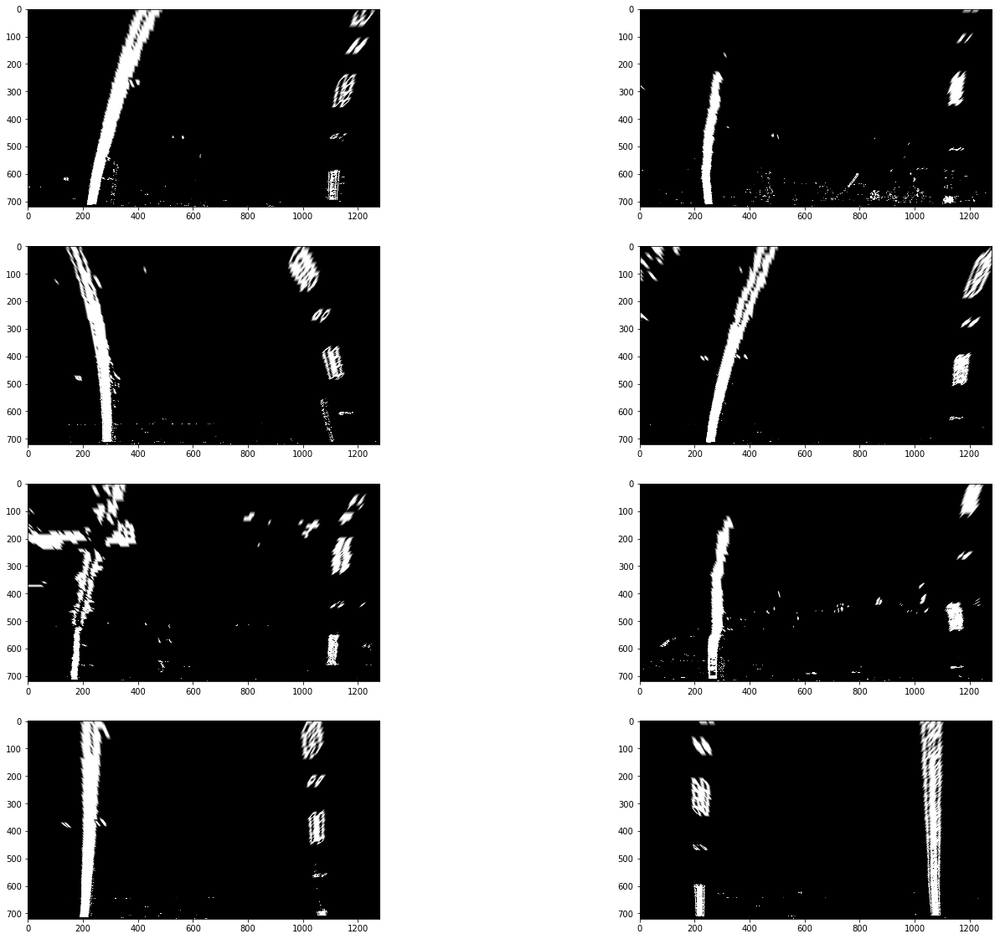

In [14]:
# Transform and visualize transformation on color binary images

ptransformed_black_binary_images = np.zeros_like(black_binary_images)

for index, image in enumerate(black_binary_images):
    ptransformed_black_binary_image, perspective_M = perspective_transform(image, src_vertices_roi, dst_vertices_roi)
    ptransformed_black_binary_image = ptransformed_black_binary_image.reshape(image_shape[0], image_shape[1], 1)
    ptransformed_black_binary_images[index] = ptransformed_black_binary_image
    
visualize_images(ptransformed_black_binary_images, 2, "perspective transformed black binary images", cmap='Greys_r')

## Step 4. Finding pixels associated with Lane boundaties
 Get the pixels for left and right curves in the image by finding lane boundary

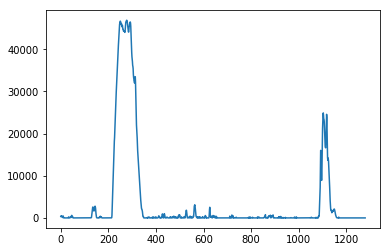

In [15]:
#Visualize historgram in bottom half of the image. See the peaks for left and right lane in the image
histogram = np.sum(ptransformed_black_binary_images[0][ptransformed_black_binary_images[0].shape[0]//2:,:], axis=0)
plt.plot(histogram)

#### Define functions to calculate window centroid, points on left lane and points on right lane

In [16]:
#define contants for the window used for the masks
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

In [17]:
def window_mask(width, height, img_ref, center,level):
    """
    The function returns a mask (rectangle with all values as '1') on the image. All other pixels in the image
    are 0 (black)
    """
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    """
    Function returns the centroids of the left and the right lane
    In addition it also returns the pixel locations of the left and right lane. These can be used
    to find the curvature of the lines by fitting them to a polynomial 
    """
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    #To get the left and right points
    l_points = np.zeros_like(image)
    r_points = np.zeros_like(image)
    l_mask = window_mask(window_width,window_height,image,l_center,0)
    r_mask = window_mask(window_width,window_height,image,r_center,0)
    l_points[(image == 1) & ((l_mask == 1) ) ] = 255
    r_points[(image == 1) & ((r_mask == 1) ) ] = 255
    left_x, left_y = l_points.nonzero()
    nonzero_left_indices = np.array([[left_x, left_y]])
    right_x, right_y = r_points.nonzero()
    nonzero_right_indices = np.array([[right_x, right_y]])
    
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
        #To get the left and right points
        l_mask = window_mask(window_width,window_height,image,l_center,level)
        r_mask = window_mask(window_width,window_height,image,r_center,level)
        l_points[(image == 1) & ((l_mask == 1) ) ] = 255
        r_points[(image == 1) & ((r_mask == 1) ) ] = 255
        left_x, left_y = l_points.nonzero()
        nonzero_left_indices = np.concatenate(np.array([[left_x, left_y]]), axis = 0)
        right_x, right_y = r_points.nonzero()
        nonzero_right_indices = np.concatenate(np.array([[right_x, right_y]]), axis = 0)

    return window_centroids, nonzero_left_indices, nonzero_right_indices

In [18]:
def visualize_window_centroids(image, window_centroids, window_width, window_height):
    """
    Helper function to visualize the centroids used to find lanes, It takes in the points for both 
    left and right lanes"""
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(image)
        r_points = np.zeros_like(image)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,image,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,image,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((image,image,image)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 0, template, 1, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((image,image,image)),np.uint8)
        
    return output


window centroids


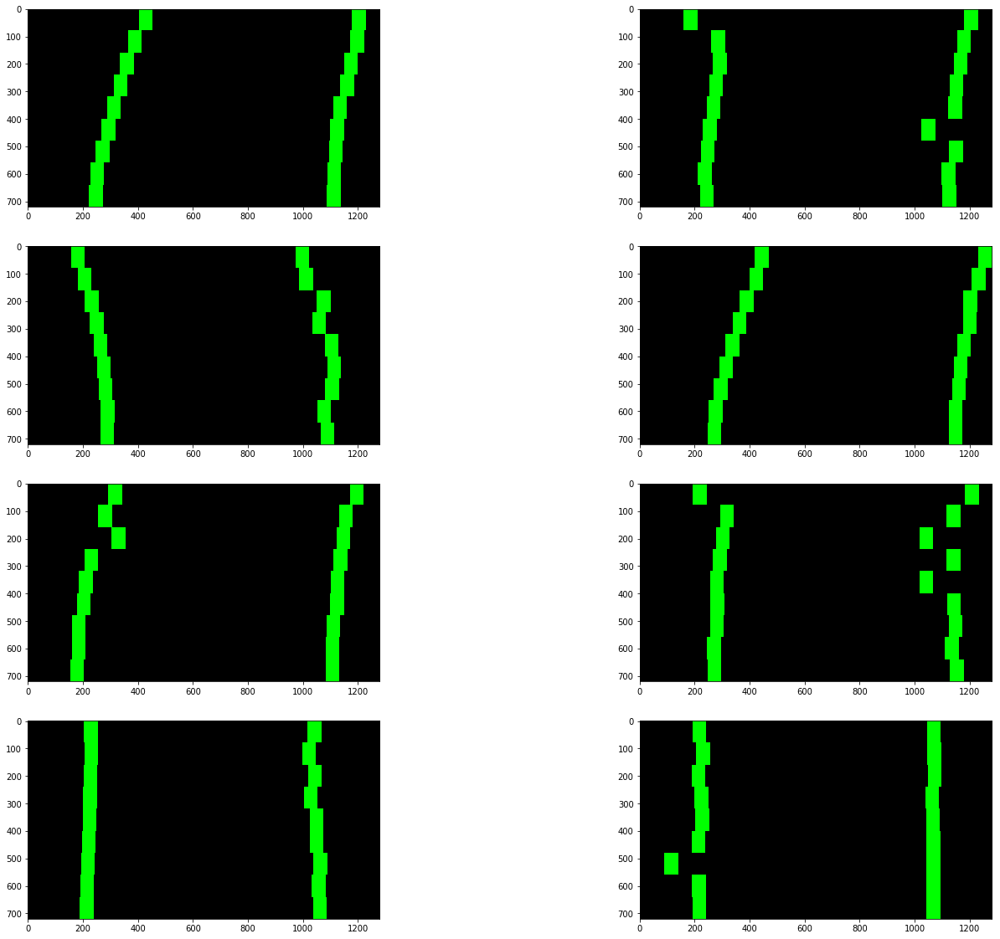

In [19]:
#Visualize the centroids

window_centroids_results = []
left_centroids_indices = []
right_centroids_indices = []
window_centroids_images = np.zeros_like(color_binary_images)
for index, image in enumerate(ptransformed_black_binary_images):
    window_centroids, left_points, right_points = find_window_centroids(image[:,:, 0]/255, window_width, window_height, margin)
    window_centroids_results.append(window_centroids)
    left_centroids_indices.append(left_points)
    right_centroids_indices.append(right_points)
    window_centroids_images[index] = visualize_window_centroids(image, window_centroids, window_width, window_height)

window_centroids_results = np.asarray(window_centroids_results)
visualize_images(window_centroids_images, 2, "window centroids")

## Step 5: Fit pixels to polymomial and calculate Curvature
Fit the pixels corresponding to lanes to a second degree polynomial. Determine lane curvature, vehicle position w.r.t center of image.

In [20]:
# Define a class to receive the characteristics of each line detection
import queue
from numpy import linalg as LA

class Line():
    def __init__(self, max_past = 10):
        #How many previous iterations to store
        self.n_iter = max_past
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = queue.Queue(self.n_iter) 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #No of iterations where the past lines were rejected
        self.iter_rejected = 0
        #Previous best_x
        self.prev_bestx = None
        #Prev best_fit
        self.prev_best_fit = None
        #Prev recentx_fitted
        self.prev_recent_xfitted = queue.Queue(self.n_iter) 
        
    def restore_essentials(self):
        """
        Restore essential variables from the previous iteration
        """
        self.bestx = self.prev_bestx 
        self.best_fit = self.prev_best_fit 
        self.recent_xfitted = self.prev_recent_xfitted
        
    def function_x(self, function, x):
        """
        Returns the value of function at point x (functions is assumed to be a 2nd degree polynomial)
        """
        return function[0]*x **2 + function[1]*x + function[2]
        
    def check_lane_width_limits(self, line, max_width = 4.9, min_width = 2, xm_per_pix = 3.7/700):
        """
        Check if lane is within the limits. 4 checks
        If lane width is less than max_width
        if lane width is more than min_width
        if current lane_width is similar to previos lane width
        In addition, it also checks if lines are almost parall using standard deviation
        """
        lane_width_meters = abs(np.mean(self.bestx - line.bestx)) * xm_per_pix
        is_in_boundary = lane_width_meters > min_width and lane_width_meters < max_width 
        is_close_previous = True
        if(self.prev_bestx != None and line.prev_bestx != None):
            prev_lane_width_meters = abs(np.mean(self.prev_bestx) - np.mean(line.prev_bestx)) * xm_per_pix
            is_close_previous = abs(lane_width_meters - prev_lane_width_meters) < 0.2
        std_dev = np.std((self.bestx - line.bestx) * xm_per_pix)
        return is_in_boundary and is_close_previous and (std_dev < 0.4)
    
    def compare_radius_curvature(self, prev_radius_of_curvature, threshold = 7000):
        """
        Compare the radius of curvature with the previous line
        """
        return (abs(self.radius_of_curvature - prev_radius_of_curvature) < threshold)
    
    def compare_line_previous_frame(self, prev_curve_fit, pixel_threshold = 100):
        """
        Comapre if the bottom pixels of the line are similar to the previous line
        """
        prev_bottom_loc = self.function_x(prev_curve_fit, image_shape[0]) 
        current_bottom_loc = self.function_x(self.current_fit, image_shape[0])
        return (abs(current_bottom_loc - prev_bottom_loc) < pixel_threshold) 
        
    def line_from_pixels(self, points, ym_per_pix = 30/720, xm_per_pix = 3.7/700):
        """
        Function takes in points (with x and y coordinates) and converts that to a an object of the line class
        It has information about radius of curvature, all x detected pixels, all y detected pixels and more
        """
        #We only store the values only if the radius of line is not much different from the previous line
        #Get all x and y pixels

        allx = points[1]
        ally = points[0]

        #Fit pixels to the polynomial
        prev_curve_fit = self.current_fit
        self.current_fit = np.polyfit(ally, allx, 2)
            
        #Get the values of y corresponding to all pixels from height/2 to height of images
        self.ally = np.asarray([x for x in range(int(image_shape[0]/2), image_shape[0], 1)])
        self.allx = self.function_x(self.current_fit, self.ally)
        
        #calculate curvature of the line (pixel)
        #radius_of_curvature = ((1 + (2*self.current_fit[0]*np.max(self.ally) + self.current_fit[1])**2)**1.5) / np.absolute(2*self.current_fit[0])
     
        ##Pixel space to world space
        #Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(self.ally*ym_per_pix, self.allx*xm_per_pix, 2)

        # Calculate the new radii of curvature
        prev_radius_of_curvature = self.radius_of_curvature
        self.radius_of_curvature = ((1 + (2*fit_cr[0]*np.max(self.ally)*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        
        ##Sanity Checks##
        queue_size = self.recent_xfitted.qsize()
        if queue_size > 0:
            self.diffs = self.current_fit - prev_curve_fit
            
#             if(not (self.compare_radius_curvature(prev_radius_of_curvature))):
#                 print("rejected - radius")
#                 self.iter_rejected = self.iter_rejected + 1
#                 return
            if(self.iter_rejected >= self.n_iter):
                if(not (self.compare_line_previous_frame(prev_curve_fit))):
                    self.iter_rejected = self.iter_rejected + 1
                    print("rejected - line previous")
                    return
            elif(not (self.compare_line_previous_frame(self.best_fit))):
                self.iter_rejected = self.iter_rejected + 1
                print("rejected - line best")
                return    
       
        self.prev_bestx = self.bestx
        self.prev_best_fit = self.best_fit
        self.prev_recent_xfitted = self.recent_xfitted
        
        if queue_size == self.n_iter:
            self.recent_xfitted.get()
        
        self.recent_xfitted.put(self.allx)
        
        if self.bestx == None:
            self.bestx = self.allx
        else:
            self.bestx = self.bestx * (queue_size-1)/queue_size + self.allx/queue_size
            
        if self.best_fit == None:
            self.best_fit = self.current_fit
        else:
            self.best_fit = self.best_fit * (queue_size-1)/queue_size + self.current_fit/queue_size
               
        self.iter_rejected = 0
        self.detected = True
            

## Step 6 and 7: Visualization
Visualize our final results

In [21]:
from numpy.linalg import inv

font                   = cv2.FONT_HERSHEY_SIMPLEX
fontScale              = 1
fontColor              = (255,255,255)
lineType               = 200

def fill_pixels_road(image, M, left_line, right_line, xm_per_pix = 3.7/700):
    """
    Functions takes in left line, right line and fill the region covered by these 2 curves, then warps it using inverse of matrix M. 
    Finally the this is added to the image passsed to the function
    """
  
    pts_left = np.array([np.transpose(np.vstack([left_line.bestx, left_line.ally]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, right_line.ally])))])
    pts = np.hstack((pts_left, pts_right))
    
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inv(M), (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    radius_string = "Radius of curvature = " + str((left_line.radius_of_curvature + right_line.radius_of_curvature)/2) + "(m)"
    line_base_pose = left_line.function_x(left_line.best_fit, image_shape[0]) + right_line.function_x(right_line.best_fit, image_shape[0])
    line_base_pose = (image_shape[1]/2 - line_base_pose/2) * xm_per_pix
    if line_base_pose > 0:
        center_string = "Vehicle is " + str(line_base_pose) + "m left of the center"
    else:
        center_string = "Vehicle is " + str(line_base_pose) + "m right of the center"
    cv2.putText(result, radius_string,  (100, 100), font, fontScale, fontColor, 3, 200)
    cv2.putText(result, center_string,  (100, 150), font, fontScale, fontColor, 3, 200)
    
   # cv2.putText(result, str(left_line.line_base_pos), cv2.FONT_HERSHEY_SIMPLEX, bottomLeftCornerOfText, font, fontScale, fontColor)
    
    return result

pixel segmented images


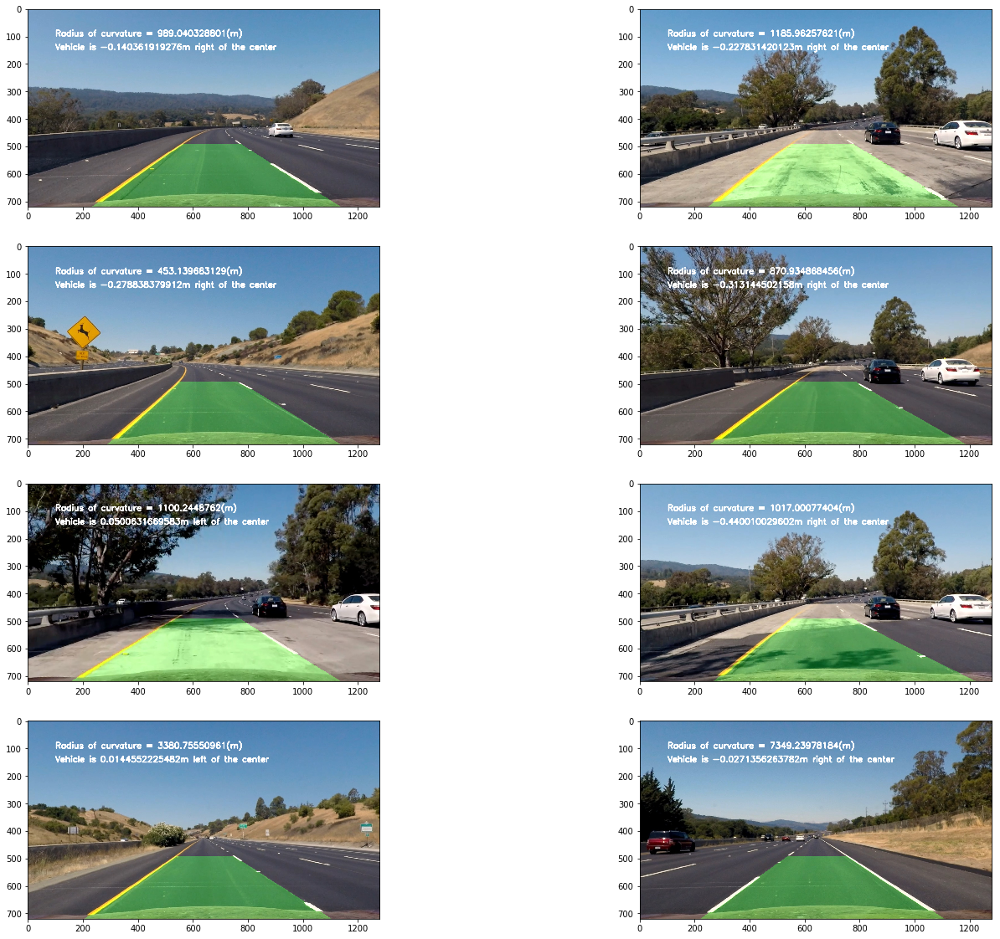

In [22]:
#Visualize pixel segmented images

pixel_segmented_images = []
for undistorted, left_points, right_points, M in zip (undistorted_images, left_centroids_indices, right_centroids_indices, ptransformed_M):
    left_line = Line()
    left_line.line_from_pixels(left_points)
    right_line = Line()
    right_line.line_from_pixels(right_points)
    pixel_segmented_images.append(fill_pixels_road(undistorted, M, left_line, right_line))
    
visualize_images(pixel_segmented_images, 2, "pixel segmented images")

## Running Test on Video

In [23]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### find_lane function to take in image and run the pipeline for detecting lanes

In [24]:
left_line = Line() 
right_line = Line()
def find_lanes(image):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    black_binary = black_binary_image(undistorted)
    ptransformed_binary, M = perspective_transform(black_binary, src_vertices_roi, dst_vertices_roi)
    window_centroids, left_points, right_points = find_window_centroids(ptransformed_binary/255, window_width, window_height, margin)
    left_line.line_from_pixels(left_points)
    right_line.line_from_pixels(right_points)
    if(not(left_line.check_lane_width_limits(right_line))):
        left_line.restore_essentials()
        right_line.restore_essentials()
        print("rejected line width")
        
    result = fill_pixels_road(undistorted, M, left_line, right_line)
    return result

In [25]:
### Test Video 1

In [26]:
project_video_path = '../data/test_videos/project_video.mp4'
project_video_output = '../results/output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
project_video = VideoFileClip(project_video_path)
white_clip = project_video.fl_image(find_lanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video ../results/output_videos/project_video.mp4
[MoviePy] Writing video ../results/output_videos/project_video.mp4


  1%|          | 13/1261 [00:03<04:57,  4.20it/s]

rejected - radius


  5%|▍         | 61/1261 [00:14<04:59,  4.00it/s]

rejected - radius


  5%|▍         | 63/1261 [00:15<04:53,  4.09it/s]

rejected - radius


  5%|▌         | 64/1261 [00:15<04:58,  4.01it/s]

rejected - radius


  7%|▋         | 88/1261 [00:21<04:55,  3.97it/s]

rejected - radius


 11%|█         | 139/1261 [00:34<04:56,  3.78it/s]

rejected - radius


 16%|█▌        | 198/1261 [00:49<04:22,  4.05it/s]

rejected - radius


 16%|█▌        | 199/1261 [00:49<04:33,  3.89it/s]

rejected - radius


 16%|█▌        | 200/1261 [00:49<04:31,  3.91it/s]

rejected - radius


 18%|█▊        | 222/1261 [00:55<04:27,  3.88it/s]

rejected - radius


 18%|█▊        | 223/1261 [00:55<04:24,  3.93it/s]

rejected - radius


 18%|█▊        | 225/1261 [00:55<04:23,  3.93it/s]

rejected - radius


 18%|█▊        | 226/1261 [00:56<04:16,  4.03it/s]

rejected - radius


 25%|██▍       | 315/1261 [01:18<03:57,  3.99it/s]

rejected - radius


 25%|██▌       | 317/1261 [01:18<03:56,  3.99it/s]

rejected - radius


 25%|██▌       | 318/1261 [01:18<03:53,  4.03it/s]

rejected - radius
rejected - radius


 25%|██▌       | 319/1261 [01:19<03:52,  4.05it/s]

rejected - radius


 25%|██▌       | 320/1261 [01:19<03:47,  4.13it/s]

rejected - radius


 26%|██▌       | 322/1261 [01:19<03:51,  4.06it/s]

rejected - radius


 26%|██▌       | 330/1261 [01:21<03:46,  4.10it/s]

rejected - radius


 26%|██▋       | 332/1261 [01:22<03:43,  4.16it/s]

rejected - radius


 26%|██▋       | 334/1261 [01:22<03:45,  4.12it/s]

rejected - radius


 27%|██▋       | 340/1261 [01:24<03:46,  4.07it/s]

rejected - radius


 27%|██▋       | 341/1261 [01:24<03:43,  4.11it/s]

rejected - radius


 27%|██▋       | 342/1261 [01:24<03:42,  4.13it/s]

rejected - radius


 28%|██▊       | 351/1261 [01:27<03:50,  3.94it/s]

rejected - radius


 28%|██▊       | 352/1261 [01:27<03:47,  4.00it/s]

rejected - radius


 28%|██▊       | 353/1261 [01:27<03:48,  3.97it/s]

rejected - radius


 28%|██▊       | 356/1261 [01:28<03:48,  3.96it/s]

rejected - radius


 28%|██▊       | 357/1261 [01:28<03:52,  3.89it/s]

rejected - radius


 28%|██▊       | 358/1261 [01:28<03:49,  3.93it/s]

rejected - radius


 28%|██▊       | 359/1261 [01:29<03:50,  3.91it/s]

rejected - radius


 29%|██▉       | 363/1261 [01:30<03:57,  3.78it/s]

rejected - radius


 29%|██▉       | 365/1261 [01:30<03:43,  4.00it/s]

rejected - radius


 29%|██▉       | 367/1261 [01:31<03:37,  4.12it/s]

rejected - radius


 29%|██▉       | 368/1261 [01:31<03:32,  4.19it/s]

rejected - radius


 29%|██▉       | 371/1261 [01:32<03:35,  4.13it/s]

rejected - radius


 30%|██▉       | 378/1261 [01:33<03:39,  4.03it/s]

rejected - radius


 30%|███       | 379/1261 [01:34<03:36,  4.08it/s]

rejected - radius


 31%|███       | 386/1261 [01:35<03:37,  4.03it/s]

rejected - radius


 31%|███       | 387/1261 [01:36<03:39,  3.99it/s]

rejected - radius


 31%|███       | 391/1261 [01:37<03:41,  3.93it/s]

rejected - radius


 31%|███       | 392/1261 [01:37<03:33,  4.07it/s]

rejected - radius


 31%|███       | 393/1261 [01:37<03:32,  4.08it/s]

rejected - radius
rejected - radius


 31%|███       | 394/1261 [01:37<03:31,  4.11it/s]

rejected - radius


 32%|███▏      | 400/1261 [01:39<03:27,  4.14it/s]

rejected - radius


 32%|███▏      | 405/1261 [01:40<03:28,  4.11it/s]

rejected - radius


 32%|███▏      | 406/1261 [01:40<03:24,  4.19it/s]

rejected - radius
rejected - radius


 32%|███▏      | 407/1261 [01:40<03:26,  4.13it/s]

rejected - radius


 32%|███▏      | 408/1261 [01:41<03:27,  4.12it/s]

rejected - radius


 33%|███▎      | 411/1261 [01:41<03:27,  4.09it/s]

rejected - radius


 33%|███▎      | 414/1261 [01:42<03:24,  4.15it/s]

rejected - radius


 33%|███▎      | 416/1261 [01:43<03:23,  4.14it/s]

rejected - radius


 33%|███▎      | 418/1261 [01:43<03:28,  4.05it/s]

rejected - radius


 34%|███▍      | 431/1261 [01:46<03:21,  4.12it/s]

rejected - radius


 34%|███▍      | 433/1261 [01:47<03:16,  4.21it/s]

rejected - radius


 34%|███▍      | 434/1261 [01:47<03:23,  4.05it/s]

rejected - radius


 35%|███▍      | 440/1261 [01:48<03:14,  4.23it/s]

rejected - radius


 35%|███▍      | 441/1261 [01:49<03:14,  4.21it/s]

rejected - radius


 35%|███▌      | 443/1261 [01:49<03:16,  4.16it/s]

rejected - radius


 35%|███▌      | 444/1261 [01:49<03:19,  4.09it/s]

rejected - radius


 35%|███▌      | 445/1261 [01:50<03:19,  4.09it/s]

rejected - radius


 36%|███▌      | 455/1261 [01:52<03:20,  4.02it/s]

rejected - radius


 36%|███▌      | 456/1261 [01:52<03:17,  4.07it/s]

rejected - radius


 36%|███▌      | 457/1261 [01:53<03:13,  4.15it/s]

rejected - radius


 36%|███▋      | 458/1261 [01:53<03:15,  4.12it/s]

rejected - radius


 36%|███▋      | 459/1261 [01:53<03:12,  4.18it/s]

rejected - radius


 36%|███▋      | 460/1261 [01:53<03:10,  4.22it/s]

rejected - radius


 37%|███▋      | 461/1261 [01:54<03:07,  4.26it/s]

rejected - radius
rejected - radius


 37%|███▋      | 463/1261 [01:54<03:13,  4.13it/s]

rejected - radius


 37%|███▋      | 464/1261 [01:54<03:11,  4.15it/s]

rejected - radius


 37%|███▋      | 465/1261 [01:55<03:11,  4.16it/s]

rejected - radius


 37%|███▋      | 466/1261 [01:55<03:10,  4.16it/s]

rejected - radius


 37%|███▋      | 467/1261 [01:55<03:10,  4.16it/s]

rejected - radius


 38%|███▊      | 477/1261 [01:57<03:08,  4.16it/s]

rejected - radius
rejected - radius


 38%|███▊      | 478/1261 [01:58<03:07,  4.17it/s]

rejected - radius


 38%|███▊      | 479/1261 [01:58<03:07,  4.17it/s]

rejected - radius


 38%|███▊      | 481/1261 [01:58<03:07,  4.16it/s]

rejected - radius


 38%|███▊      | 482/1261 [01:59<03:09,  4.12it/s]

rejected - radius


 38%|███▊      | 483/1261 [01:59<03:10,  4.08it/s]

rejected - radius


 39%|███▊      | 486/1261 [02:00<03:11,  4.05it/s]

rejected - radius


 39%|███▊      | 487/1261 [02:00<03:07,  4.12it/s]

rejected - radius
rejected - radius


 39%|███▊      | 488/1261 [02:00<03:15,  3.95it/s]

rejected - radius


 39%|███▉      | 490/1261 [02:01<03:12,  4.01it/s]

rejected - radius
rejected - radius


 39%|███▉      | 491/1261 [02:01<03:14,  3.96it/s]

rejected - radius
rejected - radius


 39%|███▉      | 492/1261 [02:01<03:09,  4.05it/s]

rejected - radius


 39%|███▉      | 493/1261 [02:01<03:08,  4.08it/s]

rejected - radius


 39%|███▉      | 494/1261 [02:02<03:05,  4.13it/s]

rejected - radius


 39%|███▉      | 495/1261 [02:02<03:05,  4.14it/s]

rejected - radius


 39%|███▉      | 496/1261 [02:02<03:05,  4.11it/s]

rejected - radius


 39%|███▉      | 497/1261 [02:02<03:07,  4.08it/s]

rejected - radius


 39%|███▉      | 498/1261 [02:03<03:07,  4.07it/s]

rejected - radius


 40%|███▉      | 499/1261 [02:03<03:04,  4.14it/s]

rejected - radius
rejected - radius


 40%|███▉      | 500/1261 [02:03<03:06,  4.08it/s]

rejected - radius


 40%|███▉      | 501/1261 [02:03<03:09,  4.00it/s]

rejected - radius
rejected - radius


 40%|███▉      | 502/1261 [02:04<03:10,  3.99it/s]

rejected - radius
rejected - radius


 40%|███▉      | 504/1261 [02:04<03:06,  4.05it/s]

rejected - radius
rejected - radius


 40%|████      | 505/1261 [02:04<03:07,  4.03it/s]

rejected - radius
rejected - radius


 40%|████      | 507/1261 [02:05<03:02,  4.13it/s]

rejected - radius


 41%|████      | 511/1261 [02:06<03:11,  3.91it/s]

rejected - radius


 41%|████      | 512/1261 [02:06<03:09,  3.96it/s]

rejected - radius


 41%|████      | 515/1261 [02:07<03:08,  3.95it/s]

rejected - radius
rejected - radius


 41%|████      | 516/1261 [02:07<03:04,  4.05it/s]

rejected - radius
rejected - radius


 41%|████      | 517/1261 [02:07<03:02,  4.08it/s]

rejected - radius
rejected - radius


 41%|████      | 518/1261 [02:08<03:01,  4.10it/s]

rejected - radius
rejected - radius


 41%|████      | 519/1261 [02:08<02:58,  4.15it/s]

rejected - radius


 42%|████▏     | 524/1261 [02:09<03:08,  3.90it/s]

rejected - radius


 42%|████▏     | 525/1261 [02:09<03:04,  4.00it/s]

rejected - radius


 42%|████▏     | 526/1261 [02:10<02:59,  4.09it/s]

rejected - radius
rejected - radius


 42%|████▏     | 528/1261 [02:10<03:03,  4.00it/s]

rejected - radius


 42%|████▏     | 530/1261 [02:11<02:59,  4.07it/s]

rejected - radius


 42%|████▏     | 531/1261 [02:11<03:02,  3.99it/s]

rejected - radius


 42%|████▏     | 533/1261 [02:11<03:03,  3.96it/s]

rejected - line best


 42%|████▏     | 534/1261 [02:12<02:59,  4.04it/s]

rejected - line best


 42%|████▏     | 535/1261 [02:12<02:59,  4.05it/s]

rejected - line best


 43%|████▎     | 538/1261 [02:13<03:00,  4.01it/s]

rejected - radius


 43%|████▎     | 539/1261 [02:13<02:58,  4.04it/s]

rejected - radius


 43%|████▎     | 543/1261 [02:14<03:12,  3.74it/s]

rejected - radius


 43%|████▎     | 544/1261 [02:14<03:07,  3.82it/s]

rejected - radius


 44%|████▍     | 552/1261 [02:16<02:49,  4.19it/s]

rejected - radius


 44%|████▍     | 553/1261 [02:16<02:53,  4.08it/s]

rejected - radius


 44%|████▍     | 555/1261 [02:17<02:54,  4.06it/s]

rejected - radius


 44%|████▍     | 556/1261 [02:17<02:56,  3.99it/s]

rejected - radius
rejected - line best


 44%|████▍     | 557/1261 [02:17<02:53,  4.07it/s]

rejected - radius


 45%|████▍     | 562/1261 [02:18<02:47,  4.17it/s]

rejected - radius


 45%|████▍     | 563/1261 [02:19<02:47,  4.16it/s]

rejected - radius


 45%|████▍     | 565/1261 [02:19<02:47,  4.16it/s]

rejected - radius


 45%|████▍     | 566/1261 [02:19<02:46,  4.16it/s]

rejected - radius


 45%|████▌     | 568/1261 [02:20<02:44,  4.22it/s]

rejected - radius


 45%|████▌     | 569/1261 [02:20<02:42,  4.27it/s]

rejected - radius


 45%|████▌     | 570/1261 [02:20<02:45,  4.18it/s]

rejected - radius


 45%|████▌     | 571/1261 [02:21<02:50,  4.05it/s]

rejected - radius


 46%|████▌     | 580/1261 [02:23<02:40,  4.24it/s]

rejected - radius


 46%|████▌     | 581/1261 [02:23<02:39,  4.26it/s]

rejected - radius
rejected - radius


 46%|████▌     | 582/1261 [02:23<02:36,  4.34it/s]

rejected - radius


 47%|████▋     | 588/1261 [02:25<02:42,  4.13it/s]

rejected - radius


 47%|████▋     | 589/1261 [02:25<02:45,  4.06it/s]

rejected - radius


 48%|████▊     | 602/1261 [02:28<02:34,  4.27it/s]

rejected - radius


 48%|████▊     | 603/1261 [02:28<02:33,  4.30it/s]

rejected - radius


 48%|████▊     | 604/1261 [02:29<02:40,  4.10it/s]

rejected - radius


 48%|████▊     | 605/1261 [02:29<02:40,  4.10it/s]

rejected - radius


 49%|████▊     | 614/1261 [02:31<02:32,  4.24it/s]

rejected line width


 49%|████▉     | 615/1261 [02:31<02:35,  4.16it/s]

rejected - line best


 49%|████▉     | 616/1261 [02:31<02:36,  4.11it/s]

rejected - line best


 49%|████▉     | 617/1261 [02:32<02:34,  4.17it/s]

rejected - line best


 61%|██████    | 764/1261 [03:06<02:00,  4.14it/s]

rejected - radius


 61%|██████    | 765/1261 [03:07<01:56,  4.27it/s]

rejected - radius


 61%|██████    | 766/1261 [03:07<01:57,  4.21it/s]

rejected - radius


 64%|██████▍   | 807/1261 [03:17<01:42,  4.41it/s]

rejected - radius


 64%|██████▍   | 808/1261 [03:17<01:47,  4.20it/s]

rejected - radius


 78%|███████▊  | 989/1261 [04:02<01:05,  4.14it/s]

rejected - radius


 79%|███████▊  | 991/1261 [04:02<01:07,  3.98it/s]

rejected - radius


 79%|███████▉  | 1001/1261 [04:05<01:02,  4.17it/s]

rejected - line best


 79%|███████▉  | 1002/1261 [04:05<01:04,  4.03it/s]

rejected - line best


 82%|████████▏ | 1039/1261 [04:14<00:56,  3.95it/s]

rejected - line best


 82%|████████▏ | 1040/1261 [04:14<00:54,  4.05it/s]

rejected - line best


 83%|████████▎ | 1041/1261 [04:15<00:54,  4.05it/s]

rejected - line best


 83%|████████▎ | 1042/1261 [04:15<00:53,  4.07it/s]

rejected - line best


 83%|████████▎ | 1044/1261 [04:15<00:53,  4.08it/s]

rejected - line best


 83%|████████▎ | 1045/1261 [04:16<00:52,  4.10it/s]

rejected - line best


 83%|████████▎ | 1046/1261 [04:16<00:52,  4.06it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 1047/1261 [04:16<00:52,  4.11it/s]

rejected - line best


 83%|████████▎ | 1048/1261 [04:16<00:53,  4.02it/s]

rejected - line best
rejected - radius


 83%|████████▎ | 1049/1261 [04:17<00:52,  4.02it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 1050/1261 [04:17<00:52,  4.02it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 1051/1261 [04:17<00:51,  4.04it/s]

rejected - line best


 83%|████████▎ | 1052/1261 [04:17<00:50,  4.11it/s]

rejected - line best


 88%|████████▊ | 1106/1261 [04:31<00:38,  4.02it/s]

rejected - radius


 88%|████████▊ | 1107/1261 [04:31<00:38,  3.97it/s]

rejected - radius


 97%|█████████▋| 1220/1261 [05:00<00:10,  4.00it/s]

rejected - radius


 97%|█████████▋| 1221/1261 [05:00<00:09,  4.05it/s]

rejected - radius


 98%|█████████▊| 1240/1261 [05:05<00:05,  3.96it/s]

rejected - radius


 98%|█████████▊| 1241/1261 [05:05<00:04,  4.00it/s]

rejected - radius


 98%|█████████▊| 1242/1261 [05:06<00:04,  3.96it/s]

rejected - radius


 99%|█████████▊| 1243/1261 [05:06<00:04,  4.02it/s]

rejected - radius


 99%|█████████▊| 1244/1261 [05:06<00:04,  4.06it/s]

rejected - radius


 99%|█████████▉| 1251/1261 [05:08<00:02,  4.05it/s]

rejected - radius


 99%|█████████▉| 1252/1261 [05:08<00:02,  4.07it/s]

rejected - radius


 99%|█████████▉| 1253/1261 [05:08<00:02,  3.99it/s]

rejected - radius


 99%|█████████▉| 1254/1261 [05:09<00:01,  3.94it/s]

rejected - radius


100%|█████████▉| 1260/1261 [05:10<00:00,  3.85it/s]

rejected - radius


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../results/output_videos/project_video.mp4 

CPU times: user 15min 1s, sys: 2min 59s, total: 18min
Wall time: 5min 11s


In [27]:
project_video_path = '../data/test_videos/challenge_video.mp4'
project_video_output = '../results/output_videos/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
project_video = VideoFileClip(project_video_path)
white_clip = project_video.fl_image(find_lanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_video_output, audio=False)

rejected - radius
rejected - line best
[MoviePy] >>>> Building video ../results/output_videos/challenge_video.mp4
[MoviePy] Writing video ../results/output_videos/challenge_video.mp4


  0%|          | 1/485 [00:00<01:40,  4.82it/s]

rejected - line best


  0%|          | 2/485 [00:00<01:51,  4.34it/s]

rejected - line best


  1%|          | 3/485 [00:00<01:53,  4.24it/s]

rejected - line best


  1%|          | 4/485 [00:00<01:56,  4.13it/s]

rejected - line best


  1%|          | 5/485 [00:01<01:58,  4.06it/s]

rejected - line best


  1%|          | 6/485 [00:01<01:53,  4.22it/s]

rejected - line best


  1%|▏         | 7/485 [00:01<01:53,  4.21it/s]

rejected - line best


  9%|▉         | 44/485 [00:10<01:53,  3.90it/s]

rejected - line best


 10%|▉         | 47/485 [00:11<01:50,  3.97it/s]

rejected - line best


 10%|▉         | 48/485 [00:11<01:49,  4.01it/s]

rejected - line best


 10%|█         | 49/485 [00:12<01:48,  4.03it/s]

rejected - line best


 10%|█         | 50/485 [00:12<01:47,  4.05it/s]

rejected - line best


 11%|█         | 51/485 [00:12<01:45,  4.10it/s]

rejected - line best


 11%|█         | 52/485 [00:12<01:44,  4.13it/s]

rejected - line best


 11%|█         | 54/485 [00:13<01:44,  4.12it/s]

rejected - line best


 11%|█▏        | 55/485 [00:13<01:44,  4.12it/s]

rejected - line best


 12%|█▏        | 56/485 [00:13<01:46,  4.03it/s]

rejected - line best


 12%|█▏        | 58/485 [00:14<01:44,  4.10it/s]

rejected - line best


 12%|█▏        | 59/485 [00:14<01:44,  4.08it/s]

rejected - line best


 12%|█▏        | 60/485 [00:14<01:45,  4.02it/s]

rejected - line best


 13%|█▎        | 61/485 [00:15<01:46,  3.96it/s]

rejected - line best


 13%|█▎        | 62/485 [00:15<01:45,  4.00it/s]

rejected - line best


 13%|█▎        | 64/485 [00:15<01:48,  3.90it/s]

rejected - line best


 13%|█▎        | 65/485 [00:16<01:48,  3.88it/s]

rejected - line best


 14%|█▎        | 66/485 [00:16<01:45,  3.97it/s]

rejected - line best


 14%|█▍        | 67/485 [00:16<01:44,  4.02it/s]

rejected - line best
rejected - line best


 14%|█▍        | 68/485 [00:16<01:44,  3.97it/s]

rejected - line best


 14%|█▍        | 69/485 [00:17<01:47,  3.87it/s]

rejected - line best
rejected - line best


 14%|█▍        | 70/485 [00:17<01:43,  4.00it/s]

rejected - line best
rejected - line best


 15%|█▍        | 71/485 [00:17<01:42,  4.03it/s]

rejected - line best
rejected - line best


 15%|█▍        | 72/485 [00:17<01:42,  4.05it/s]

rejected - line best
rejected - line best


 15%|█▌        | 73/485 [00:18<01:42,  4.03it/s]

rejected - line best
rejected - line best


 15%|█▌        | 74/485 [00:18<01:42,  4.01it/s]

rejected - line best
rejected - line best


 15%|█▌        | 75/485 [00:18<01:42,  3.99it/s]

rejected - line best
rejected - line best


 16%|█▌        | 76/485 [00:18<01:44,  3.91it/s]

rejected - line best
rejected - line best


 16%|█▌        | 77/485 [00:19<01:42,  3.99it/s]

rejected - line best


 16%|█▌        | 78/485 [00:19<01:39,  4.08it/s]

rejected - line best
rejected - line best


 16%|█▋        | 79/485 [00:19<01:39,  4.08it/s]

rejected - line best


 16%|█▋        | 80/485 [00:19<01:41,  3.98it/s]

rejected - line best
rejected - line best


 17%|█▋        | 81/485 [00:20<01:40,  4.01it/s]

rejected - line best
rejected - line best


 17%|█▋        | 82/485 [00:20<01:41,  3.96it/s]

rejected - line best
rejected - line best


 17%|█▋        | 83/485 [00:20<01:40,  4.01it/s]

rejected - line best
rejected - line best


 17%|█▋        | 84/485 [00:20<01:40,  4.00it/s]

rejected - line best
rejected - line best


 18%|█▊        | 85/485 [00:21<01:40,  3.98it/s]

rejected - line best
rejected - line best


 18%|█▊        | 86/485 [00:21<01:40,  3.98it/s]

rejected - line best
rejected - line best


 18%|█▊        | 87/485 [00:21<01:39,  3.98it/s]

rejected - line best
rejected - line best


 18%|█▊        | 88/485 [00:21<01:40,  3.95it/s]

rejected - line best


 18%|█▊        | 89/485 [00:22<01:39,  3.97it/s]

rejected - line best
rejected - line best


 19%|█▊        | 90/485 [00:22<01:37,  4.04it/s]

rejected - line best


 19%|█▉        | 91/485 [00:22<01:35,  4.11it/s]

rejected - line best
rejected - line best


 19%|█▉        | 92/485 [00:22<01:36,  4.08it/s]

rejected - line best
rejected - line best


 19%|█▉        | 93/485 [00:23<01:37,  4.03it/s]

rejected - line best
rejected - line best


 19%|█▉        | 94/485 [00:23<01:36,  4.03it/s]

rejected - line best
rejected - line best


 20%|█▉        | 95/485 [00:23<01:36,  4.03it/s]

rejected - line best
rejected - line best


 20%|█▉        | 96/485 [00:23<01:39,  3.90it/s]

rejected - line best
rejected - line best


 20%|██        | 97/485 [00:24<01:37,  3.97it/s]

rejected - line best
rejected - line best


 20%|██        | 98/485 [00:24<01:35,  4.05it/s]

rejected - line best
rejected - line best


 20%|██        | 99/485 [00:24<01:36,  4.01it/s]

rejected - line best


 21%|██        | 100/485 [00:24<01:38,  3.91it/s]

rejected - line best
rejected - line best


 21%|██        | 101/485 [00:25<01:38,  3.91it/s]

rejected - line best


 21%|██        | 102/485 [00:25<01:36,  3.97it/s]

rejected - line best


 21%|██        | 103/485 [00:25<01:36,  3.97it/s]

rejected - line best
rejected - line best


 21%|██▏       | 104/485 [00:25<01:37,  3.90it/s]

rejected - line best
rejected - line best


 22%|██▏       | 105/485 [00:26<01:34,  4.00it/s]

rejected - line best


 22%|██▏       | 106/485 [00:26<01:34,  4.00it/s]

rejected - line best


 22%|██▏       | 107/485 [00:26<01:35,  3.97it/s]

rejected - line best


 22%|██▏       | 108/485 [00:26<01:36,  3.89it/s]

rejected - line best


 22%|██▏       | 109/485 [00:27<01:36,  3.88it/s]

rejected - line best


 23%|██▎       | 110/485 [00:27<01:35,  3.93it/s]

rejected - line previous


 23%|██▎       | 112/485 [00:27<01:36,  3.88it/s]

rejected - line best


 23%|██▎       | 113/485 [00:28<01:33,  3.97it/s]

rejected - line best


 24%|██▎       | 114/485 [00:28<01:32,  4.03it/s]

rejected - line best


 24%|██▎       | 115/485 [00:28<01:30,  4.10it/s]

rejected - line best


 24%|██▍       | 116/485 [00:28<01:29,  4.12it/s]

rejected - line best


 24%|██▍       | 117/485 [00:29<01:30,  4.05it/s]

rejected - line best


 24%|██▍       | 118/485 [00:29<01:32,  3.96it/s]

rejected - line best


 25%|██▍       | 119/485 [00:29<01:31,  3.99it/s]

rejected - line best


 25%|██▍       | 120/485 [00:29<01:33,  3.90it/s]

rejected - line best


 25%|██▍       | 121/485 [00:30<01:33,  3.88it/s]

rejected - line best


 25%|██▌       | 122/485 [00:30<01:33,  3.89it/s]

rejected line width


 25%|██▌       | 123/485 [00:30<01:31,  3.97it/s]

rejected - line best


 26%|██▌       | 124/485 [00:30<01:31,  3.94it/s]

rejected - line best


 26%|██▌       | 125/485 [00:31<01:31,  3.91it/s]

rejected line width


 26%|██▌       | 127/485 [00:31<01:28,  4.03it/s]

rejected line width


 26%|██▋       | 128/485 [00:31<01:29,  3.97it/s]

rejected line width


 27%|██▋       | 129/485 [00:32<01:28,  4.01it/s]

rejected line width


 27%|██▋       | 130/485 [00:32<01:27,  4.05it/s]

rejected line width


 27%|██▋       | 131/485 [00:32<01:30,  3.93it/s]

rejected line width


 27%|██▋       | 132/485 [00:32<01:29,  3.95it/s]

rejected line width


 27%|██▋       | 133/485 [00:33<01:28,  3.98it/s]

rejected - line best


 28%|██▊       | 134/485 [00:33<01:26,  4.07it/s]

rejected - line best
rejected - line best


 28%|██▊       | 135/485 [00:33<01:25,  4.11it/s]

rejected - line best
rejected - line best


 28%|██▊       | 136/485 [00:33<01:25,  4.08it/s]

rejected - line best
rejected - line best


 28%|██▊       | 137/485 [00:34<01:24,  4.13it/s]

rejected - line best
rejected - line best


 28%|██▊       | 138/485 [00:34<01:22,  4.19it/s]

rejected - line best
rejected - line best


 29%|██▊       | 139/485 [00:34<01:22,  4.20it/s]

rejected - line best
rejected - line best


 29%|██▉       | 140/485 [00:34<01:25,  4.05it/s]

rejected - line best
rejected - line best


 29%|██▉       | 141/485 [00:35<01:25,  4.01it/s]

rejected - line best
rejected - line best


 29%|██▉       | 142/485 [00:35<01:25,  4.02it/s]

rejected - line best
rejected - line best


 29%|██▉       | 143/485 [00:35<01:26,  3.97it/s]

rejected line width


 30%|██▉       | 144/485 [00:35<01:28,  3.84it/s]

rejected - line best


 30%|██▉       | 145/485 [00:36<01:25,  3.96it/s]

rejected - line best


 30%|███       | 146/485 [00:36<01:23,  4.04it/s]

rejected - line best


 30%|███       | 147/485 [00:36<01:24,  3.99it/s]

rejected - line best
rejected - line best


 31%|███       | 148/485 [00:36<01:25,  3.95it/s]

rejected - line best
rejected - line best


 31%|███       | 149/485 [00:37<01:27,  3.83it/s]

rejected - line best
rejected - line best


 31%|███       | 150/485 [00:37<01:25,  3.93it/s]

rejected - line best
rejected - line best


 31%|███       | 151/485 [00:37<01:24,  3.95it/s]

rejected - line best


 31%|███▏      | 152/485 [00:37<01:28,  3.78it/s]

rejected - line best


 32%|███▏      | 153/485 [00:38<01:26,  3.84it/s]

rejected - radius
rejected - line best


 32%|███▏      | 154/485 [00:38<01:24,  3.94it/s]

rejected - radius


 32%|███▏      | 156/485 [00:38<01:22,  3.97it/s]

rejected - line best


 32%|███▏      | 157/485 [00:39<01:20,  4.07it/s]

rejected - radius
rejected - line best


 33%|███▎      | 158/485 [00:39<01:21,  4.00it/s]

rejected - line best


 33%|███▎      | 159/485 [00:39<01:21,  3.98it/s]

rejected - line best


 33%|███▎      | 160/485 [00:39<01:23,  3.91it/s]

rejected - line best


 33%|███▎      | 161/485 [00:40<01:22,  3.94it/s]

rejected - line best


 33%|███▎      | 162/485 [00:40<01:21,  3.97it/s]

rejected - line best


 34%|███▎      | 163/485 [00:40<01:21,  3.95it/s]

rejected - line best


 34%|███▍      | 164/485 [00:40<01:23,  3.87it/s]

rejected - line best


 34%|███▍      | 165/485 [00:41<01:20,  3.96it/s]

rejected - line best


 34%|███▍      | 166/485 [00:41<01:19,  4.01it/s]

rejected line width


 34%|███▍      | 167/485 [00:41<01:18,  4.04it/s]

rejected - line best


 35%|███▍      | 168/485 [00:41<01:17,  4.07it/s]

rejected - line best


 35%|███▍      | 169/485 [00:42<01:18,  4.03it/s]

rejected - line best


 35%|███▌      | 170/485 [00:42<01:18,  4.03it/s]

rejected - line best


 35%|███▌      | 171/485 [00:42<01:17,  4.07it/s]

rejected - line best


 35%|███▌      | 172/485 [00:42<01:16,  4.07it/s]

rejected - line best


 36%|███▌      | 173/485 [00:43<01:16,  4.06it/s]

rejected - line best


 36%|███▌      | 174/485 [00:43<01:18,  3.98it/s]

rejected - line best


 36%|███▌      | 175/485 [00:43<01:17,  3.97it/s]

rejected - line best


 36%|███▋      | 176/485 [00:43<01:18,  3.95it/s]

rejected - line best


 36%|███▋      | 177/485 [00:44<01:16,  4.01it/s]

rejected line width


 37%|███▋      | 178/485 [00:44<01:16,  4.03it/s]

rejected - line best


 37%|███▋      | 179/485 [00:44<01:16,  4.02it/s]

rejected - line best


 37%|███▋      | 180/485 [00:44<01:16,  3.99it/s]

rejected - line best


 37%|███▋      | 181/485 [00:45<01:14,  4.07it/s]

rejected - line best


 38%|███▊      | 182/485 [00:45<01:16,  3.96it/s]

rejected - line best


 38%|███▊      | 183/485 [00:45<01:16,  3.93it/s]

rejected - line best


 38%|███▊      | 184/485 [00:45<01:15,  3.96it/s]

rejected - line best


 38%|███▊      | 185/485 [00:46<01:16,  3.93it/s]

rejected - line best


 38%|███▊      | 186/485 [00:46<01:15,  3.97it/s]

rejected - line best


 39%|███▊      | 187/485 [00:46<01:14,  4.00it/s]

rejected - line best


 39%|███▉      | 188/485 [00:46<01:15,  3.91it/s]

rejected line width


 39%|███▉      | 189/485 [00:47<01:15,  3.94it/s]

rejected - line best


 39%|███▉      | 190/485 [00:47<01:15,  3.93it/s]

rejected - line best


 39%|███▉      | 191/485 [00:47<01:16,  3.86it/s]

rejected - line best


 40%|███▉      | 192/485 [00:47<01:15,  3.88it/s]

rejected - line best


 40%|███▉      | 193/485 [00:48<01:13,  3.99it/s]

rejected - line best


 40%|████      | 194/485 [00:48<01:12,  4.02it/s]

rejected - line best


 40%|████      | 195/485 [00:48<01:13,  3.96it/s]

rejected - line best


 40%|████      | 196/485 [00:48<01:14,  3.85it/s]

rejected - line best


 41%|████      | 197/485 [00:49<01:14,  3.84it/s]

rejected - line best


 41%|████      | 198/485 [00:49<01:14,  3.84it/s]

rejected - line best


 41%|████      | 199/485 [00:49<01:16,  3.71it/s]

rejected line width


 41%|████      | 200/485 [00:50<01:15,  3.79it/s]

rejected - radius


 41%|████▏     | 201/485 [00:50<01:15,  3.76it/s]

rejected - radius


 42%|████▏     | 202/485 [00:50<01:12,  3.89it/s]

rejected - line best


 42%|████▏     | 203/485 [00:50<01:12,  3.91it/s]

rejected - line best


 42%|████▏     | 204/485 [00:51<01:11,  3.94it/s]

rejected - line best


 42%|████▏     | 205/485 [00:51<01:10,  3.99it/s]

rejected - line best


 42%|████▏     | 206/485 [00:51<01:08,  4.04it/s]

rejected - line best


 43%|████▎     | 207/485 [00:51<01:08,  4.09it/s]

rejected - line best


 43%|████▎     | 208/485 [00:52<01:07,  4.12it/s]

rejected - line best


 43%|████▎     | 209/485 [00:52<01:08,  4.04it/s]

rejected - line best


 44%|████▎     | 211/485 [00:52<01:08,  4.00it/s]

rejected - line best


 44%|████▎     | 212/485 [00:53<01:08,  3.98it/s]

rejected - line best


 44%|████▍     | 213/485 [00:53<01:07,  4.01it/s]

rejected - line best


 44%|████▍     | 214/485 [00:53<01:06,  4.06it/s]

rejected - line best


 44%|████▍     | 215/485 [00:53<01:07,  3.99it/s]

rejected - line best


 45%|████▍     | 216/485 [00:54<01:06,  4.05it/s]

rejected - line best


 45%|████▍     | 217/485 [00:54<01:05,  4.10it/s]

rejected - line best


 45%|████▍     | 218/485 [00:54<01:06,  4.04it/s]

rejected - line best


 45%|████▌     | 219/485 [00:54<01:05,  4.06it/s]

rejected - line best


 46%|████▌     | 221/485 [00:55<01:05,  4.05it/s]

rejected - line best


 46%|████▌     | 222/485 [00:55<01:05,  4.02it/s]

rejected - line best


 47%|████▋     | 226/485 [00:56<01:03,  4.10it/s]

rejected - line best


 47%|████▋     | 227/485 [00:56<01:05,  3.95it/s]

rejected - line best


 47%|████▋     | 228/485 [00:57<01:11,  3.60it/s]

rejected - line best


 47%|████▋     | 229/485 [00:57<01:09,  3.69it/s]

rejected - line best


 47%|████▋     | 230/485 [00:57<01:08,  3.72it/s]

rejected - line best


 48%|████▊     | 231/485 [00:57<01:07,  3.74it/s]

rejected - line best


 48%|████▊     | 232/485 [00:58<01:06,  3.81it/s]

rejected - line best


 48%|████▊     | 233/485 [00:58<01:03,  3.94it/s]

rejected - line best


 49%|████▉     | 239/485 [00:59<01:00,  4.06it/s]

rejected - line best


 49%|████▉     | 240/485 [01:00<01:00,  4.06it/s]

rejected - line best


 50%|████▉     | 241/485 [01:00<01:00,  4.02it/s]

rejected - line best


 50%|████▉     | 242/485 [01:00<01:00,  4.04it/s]

rejected - line best


 50%|█████     | 243/485 [01:00<01:01,  3.92it/s]

rejected - line best


 50%|█████     | 244/485 [01:01<01:01,  3.91it/s]

rejected - line best


 51%|█████     | 245/485 [01:01<01:04,  3.72it/s]

rejected - line best


 51%|█████     | 246/485 [01:01<01:05,  3.64it/s]

rejected - line best


 51%|█████     | 247/485 [01:02<01:05,  3.65it/s]

rejected - line best


 51%|█████▏    | 249/485 [01:02<01:03,  3.71it/s]

rejected - line best


 52%|█████▏    | 253/485 [01:03<01:05,  3.52it/s]

rejected - line best


 52%|█████▏    | 254/485 [01:03<01:04,  3.60it/s]

rejected - line best


 53%|█████▎    | 255/485 [01:04<01:01,  3.76it/s]

rejected - line best


 53%|█████▎    | 256/485 [01:04<01:00,  3.76it/s]

rejected - line best


 53%|█████▎    | 257/485 [01:04<01:02,  3.66it/s]

rejected - line best


 53%|█████▎    | 258/485 [01:05<01:03,  3.60it/s]

rejected - line best


 53%|█████▎    | 259/485 [01:05<01:00,  3.75it/s]

rejected - line best


 54%|█████▎    | 260/485 [01:05<01:00,  3.73it/s]

rejected - line best


 54%|█████▍    | 261/485 [01:05<01:03,  3.53it/s]

rejected - line best


 54%|█████▍    | 262/485 [01:06<01:04,  3.46it/s]

rejected - line best


 55%|█████▍    | 266/485 [01:07<00:57,  3.83it/s]

rejected - line best


 55%|█████▌    | 267/485 [01:07<00:55,  3.91it/s]

rejected - line best


 55%|█████▌    | 268/485 [01:07<00:56,  3.85it/s]

rejected - line best


 55%|█████▌    | 269/485 [01:07<00:56,  3.83it/s]

rejected - line best


 56%|█████▌    | 270/485 [01:08<00:58,  3.69it/s]

rejected - line best


 56%|█████▌    | 271/485 [01:08<01:00,  3.56it/s]

rejected - line best


 56%|█████▌    | 272/485 [01:08<00:58,  3.63it/s]

rejected - line best


 56%|█████▋    | 273/485 [01:09<00:57,  3.70it/s]

rejected - line best


 56%|█████▋    | 274/485 [01:09<00:55,  3.82it/s]

rejected - line best


 58%|█████▊    | 282/485 [01:11<00:50,  4.01it/s]

rejected - line best


 58%|█████▊    | 283/485 [01:11<00:49,  4.05it/s]

rejected - line best


 59%|█████▊    | 284/485 [01:11<00:50,  3.98it/s]

rejected - line best


 59%|█████▉    | 285/485 [01:12<00:50,  3.93it/s]

rejected - line best


 59%|█████▉    | 286/485 [01:12<00:49,  3.98it/s]

rejected - line best


 59%|█████▉    | 287/485 [01:12<00:49,  4.01it/s]

rejected - line best


 59%|█████▉    | 288/485 [01:12<00:49,  3.98it/s]

rejected - line best


 60%|██████    | 293/485 [01:14<00:50,  3.81it/s]

rejected - line best


 61%|██████    | 294/485 [01:14<00:50,  3.82it/s]

rejected - line best


 61%|██████    | 295/485 [01:14<00:49,  3.85it/s]

rejected - line best


 61%|██████    | 296/485 [01:14<00:47,  3.98it/s]

rejected - line best


 61%|██████    | 297/485 [01:15<00:47,  3.93it/s]

rejected - line best


 61%|██████▏   | 298/485 [01:15<00:47,  3.95it/s]

rejected - line best


 62%|██████▏   | 299/485 [01:15<00:46,  4.04it/s]

rejected - line best


 62%|██████▏   | 300/485 [01:15<00:45,  4.06it/s]

rejected - line best


 62%|██████▏   | 301/485 [01:16<00:48,  3.83it/s]

rejected - line best


 62%|██████▏   | 302/485 [01:16<00:48,  3.79it/s]

rejected - line best


 63%|██████▎   | 304/485 [01:16<00:46,  3.93it/s]

rejected - line best


 63%|██████▎   | 305/485 [01:17<00:45,  3.91it/s]

rejected - line best


 63%|██████▎   | 306/485 [01:17<00:45,  3.96it/s]

rejected - line best


 63%|██████▎   | 307/485 [01:17<00:45,  3.90it/s]

rejected - line best


 64%|██████▎   | 308/485 [01:17<00:45,  3.88it/s]

rejected - line best


 64%|██████▎   | 309/485 [01:18<00:44,  3.98it/s]

rejected - line best


 64%|██████▍   | 310/485 [01:18<00:43,  4.03it/s]

rejected - line best


 64%|██████▍   | 311/485 [01:18<00:43,  3.96it/s]

rejected - line best


 64%|██████▍   | 312/485 [01:18<00:43,  3.95it/s]

rejected - line best


 65%|██████▍   | 313/485 [01:19<00:44,  3.88it/s]

rejected - line best


 65%|██████▍   | 315/485 [01:19<00:43,  3.90it/s]

rejected - line best


 65%|██████▌   | 316/485 [01:19<00:43,  3.90it/s]

rejected - line best


 66%|██████▌   | 318/485 [01:20<00:41,  4.00it/s]

rejected - line best


 66%|██████▌   | 320/485 [01:20<00:40,  4.10it/s]

rejected - radius


 66%|██████▌   | 321/485 [01:21<00:38,  4.22it/s]

rejected - radius


 67%|██████▋   | 323/485 [01:21<00:37,  4.30it/s]

rejected - line best


 67%|██████▋   | 324/485 [01:21<00:37,  4.32it/s]

rejected - line best


 67%|██████▋   | 325/485 [01:22<00:40,  3.94it/s]

rejected - line best


 67%|██████▋   | 326/485 [01:22<00:40,  3.95it/s]

rejected - line best


 67%|██████▋   | 327/485 [01:22<00:40,  3.93it/s]

rejected - line best


 68%|██████▊   | 328/485 [01:22<00:39,  3.97it/s]

rejected - line best


 68%|██████▊   | 329/485 [01:23<00:39,  3.96it/s]

rejected - line best


 68%|██████▊   | 330/485 [01:23<00:39,  3.94it/s]

rejected - line best


 69%|██████▊   | 333/485 [01:24<00:41,  3.69it/s]

rejected - radius


 69%|██████▉   | 334/485 [01:24<00:41,  3.64it/s]

rejected - line best


 69%|██████▉   | 335/485 [01:24<00:40,  3.74it/s]

rejected - radius


 69%|██████▉   | 336/485 [01:25<00:38,  3.85it/s]

rejected - radius


 69%|██████▉   | 337/485 [01:25<00:37,  3.93it/s]

rejected - line best


 70%|██████▉   | 338/485 [01:25<00:36,  3.98it/s]

rejected - line best


 70%|██████▉   | 339/485 [01:25<00:37,  3.85it/s]

rejected - line best


 70%|███████   | 340/485 [01:26<00:40,  3.62it/s]

rejected - radius


 70%|███████   | 341/485 [01:26<00:40,  3.52it/s]

rejected - line best


 71%|███████   | 342/485 [01:26<00:40,  3.51it/s]

rejected - radius


 71%|███████   | 343/485 [01:26<00:38,  3.71it/s]

rejected - radius


 71%|███████   | 344/485 [01:27<00:36,  3.84it/s]

rejected - radius


 71%|███████   | 345/485 [01:27<00:36,  3.88it/s]

rejected - line previous


 71%|███████▏  | 346/485 [01:27<00:35,  3.94it/s]

rejected - radius


 72%|███████▏  | 347/485 [01:27<00:34,  4.02it/s]

rejected - radius


 72%|███████▏  | 348/485 [01:28<00:34,  3.96it/s]

rejected - line previous


 72%|███████▏  | 350/485 [01:28<00:34,  3.95it/s]

rejected - radius


 72%|███████▏  | 351/485 [01:28<00:34,  3.84it/s]

rejected - radius
rejected - radius


 73%|███████▎  | 352/485 [01:29<00:33,  3.95it/s]

rejected - radius
rejected - line best


 73%|███████▎  | 353/485 [01:29<00:33,  3.92it/s]

rejected - line best


 73%|███████▎  | 354/485 [01:29<00:33,  3.95it/s]

rejected - radius
rejected - line best


 73%|███████▎  | 355/485 [01:29<00:33,  3.90it/s]

rejected - line best


 73%|███████▎  | 356/485 [01:30<00:33,  3.90it/s]

rejected - line best


 74%|███████▎  | 357/485 [01:30<00:32,  3.94it/s]

rejected - line best


 74%|███████▍  | 358/485 [01:30<00:32,  3.92it/s]

rejected - line best


 75%|███████▌  | 365/485 [01:32<00:30,  3.93it/s]

rejected - line best


 75%|███████▌  | 366/485 [01:32<00:30,  3.84it/s]

rejected - radius


 76%|███████▌  | 367/485 [01:33<00:31,  3.76it/s]

rejected - radius


 76%|███████▌  | 368/485 [01:33<00:30,  3.84it/s]

rejected - line best


 76%|███████▌  | 369/485 [01:33<00:29,  3.94it/s]

rejected - line best


 76%|███████▋  | 370/485 [01:33<00:28,  3.97it/s]

rejected - line best


 79%|███████▊  | 381/485 [01:36<00:25,  4.10it/s]

rejected - radius


 79%|███████▉  | 382/485 [01:36<00:25,  4.06it/s]

rejected - radius


 79%|███████▉  | 383/485 [01:36<00:25,  4.08it/s]

rejected - radius


 79%|███████▉  | 384/485 [01:37<00:24,  4.12it/s]

rejected - radius


 80%|███████▉  | 386/485 [01:37<00:25,  3.91it/s]

rejected - radius


 80%|███████▉  | 387/485 [01:37<00:24,  4.00it/s]

rejected - radius


 80%|████████  | 388/485 [01:38<00:25,  3.86it/s]

rejected - radius


 80%|████████  | 389/485 [01:38<00:24,  3.98it/s]

rejected - radius


 81%|████████  | 391/485 [01:38<00:23,  4.06it/s]

rejected - radius


 82%|████████▏ | 398/485 [01:40<00:21,  4.10it/s]

rejected - radius


 82%|████████▏ | 399/485 [01:40<00:21,  3.99it/s]

rejected - radius


 82%|████████▏ | 400/485 [01:41<00:21,  4.01it/s]

rejected - radius


 83%|████████▎ | 403/485 [01:41<00:19,  4.11it/s]

rejected - radius


 83%|████████▎ | 404/485 [01:42<00:19,  4.12it/s]

rejected - radius


 84%|████████▎ | 405/485 [01:42<00:19,  4.14it/s]

rejected - radius


 84%|████████▎ | 406/485 [01:42<00:19,  4.14it/s]

rejected - radius


 84%|████████▍ | 407/485 [01:42<00:18,  4.19it/s]

rejected - radius


 85%|████████▍ | 410/485 [01:43<00:18,  4.13it/s]

rejected - line best


 85%|████████▍ | 411/485 [01:43<00:18,  4.04it/s]

rejected - line best


 86%|████████▌ | 415/485 [01:44<00:17,  4.05it/s]

rejected - radius


 86%|████████▌ | 416/485 [01:45<00:16,  4.12it/s]

rejected - radius


 86%|████████▌ | 417/485 [01:45<00:16,  4.18it/s]

rejected - radius
rejected - radius


 86%|████████▌ | 418/485 [01:45<00:16,  4.12it/s]

rejected - radius
rejected - radius


 86%|████████▋ | 419/485 [01:45<00:16,  4.01it/s]

rejected - radius


 87%|████████▋ | 420/485 [01:46<00:16,  3.98it/s]

rejected - radius
rejected - radius


 87%|████████▋ | 421/485 [01:46<00:15,  4.09it/s]

rejected - radius
rejected - radius


 87%|████████▋ | 422/485 [01:46<00:15,  4.06it/s]

rejected - radius


 87%|████████▋ | 423/485 [01:46<00:15,  3.99it/s]

rejected - line best


 87%|████████▋ | 424/485 [01:47<00:15,  4.04it/s]

rejected - line best


 88%|████████▊ | 425/485 [01:47<00:14,  4.08it/s]

rejected - line best


 88%|████████▊ | 427/485 [01:47<00:14,  3.93it/s]

rejected - radius


 88%|████████▊ | 428/485 [01:48<00:14,  3.90it/s]

rejected - radius


 89%|████████▊ | 430/485 [01:48<00:13,  3.99it/s]

rejected - radius
rejected - radius


 89%|████████▉ | 431/485 [01:48<00:14,  3.81it/s]

rejected - radius


 89%|████████▉ | 432/485 [01:49<00:13,  3.87it/s]

rejected - radius


 90%|█████████ | 437/485 [01:50<00:11,  4.05it/s]

rejected - line best


 90%|█████████ | 438/485 [01:50<00:11,  4.03it/s]

rejected - line best


 91%|█████████ | 439/485 [01:50<00:11,  4.03it/s]

rejected - line best
rejected - line best


 91%|█████████ | 440/485 [01:51<00:10,  4.12it/s]

rejected - line best


 91%|█████████ | 441/485 [01:51<00:10,  4.07it/s]

rejected - line best
rejected line width


 91%|█████████ | 442/485 [01:51<00:10,  4.07it/s]

rejected - line best


 91%|█████████▏| 443/485 [01:51<00:10,  4.09it/s]

rejected - line best


 92%|█████████▏| 444/485 [01:52<00:10,  4.09it/s]

rejected - line best
rejected line width


 92%|█████████▏| 445/485 [01:52<00:09,  4.15it/s]

rejected - line best
rejected line width


 92%|█████████▏| 446/485 [01:52<00:09,  4.07it/s]

rejected - line best
rejected line width


 92%|█████████▏| 447/485 [01:52<00:09,  4.10it/s]

rejected - line best
rejected line width


 92%|█████████▏| 448/485 [01:53<00:08,  4.11it/s]

rejected - line best
rejected line width


 93%|█████████▎| 449/485 [01:53<00:08,  4.10it/s]

rejected - line best


 93%|█████████▎| 450/485 [01:53<00:08,  4.11it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 451/485 [01:53<00:08,  4.08it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 452/485 [01:53<00:08,  4.09it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 453/485 [01:54<00:07,  4.11it/s]

rejected - line best
rejected - line best


 94%|█████████▎| 454/485 [01:54<00:07,  4.10it/s]

rejected - line best
rejected - line best


 94%|█████████▍| 455/485 [01:54<00:07,  3.99it/s]

rejected - line best


 94%|█████████▍| 456/485 [01:54<00:07,  4.03it/s]

rejected - line best


 94%|█████████▍| 457/485 [01:55<00:06,  4.01it/s]

rejected - line best


 94%|█████████▍| 458/485 [01:55<00:06,  4.03it/s]

rejected - line best


 95%|█████████▍| 459/485 [01:55<00:06,  3.97it/s]

rejected - line best


 95%|█████████▌| 461/485 [01:56<00:05,  4.03it/s]

rejected - line best


 95%|█████████▌| 462/485 [01:56<00:05,  3.99it/s]

rejected - line best


 95%|█████████▌| 463/485 [01:56<00:05,  4.07it/s]

rejected - line best


 96%|█████████▌| 464/485 [01:56<00:05,  4.14it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 465/485 [01:57<00:04,  4.14it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 466/485 [01:57<00:04,  4.07it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 467/485 [01:57<00:04,  4.14it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 468/485 [01:57<00:04,  4.13it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 469/485 [01:58<00:03,  4.22it/s]

rejected - line best


 97%|█████████▋| 470/485 [01:58<00:03,  4.21it/s]

rejected - line best


 97%|█████████▋| 472/485 [01:58<00:03,  4.24it/s]

rejected - line best


 98%|█████████▊| 473/485 [01:59<00:02,  4.23it/s]

rejected - line best


 98%|█████████▊| 474/485 [01:59<00:02,  4.15it/s]

rejected - line best


 98%|█████████▊| 475/485 [01:59<00:02,  4.08it/s]

rejected - line best


 98%|█████████▊| 476/485 [01:59<00:02,  4.07it/s]

rejected - line best


 98%|█████████▊| 477/485 [02:00<00:01,  4.13it/s]

rejected - line best
rejected - line best


 99%|█████████▊| 478/485 [02:00<00:01,  4.14it/s]

rejected - line best
rejected - line best


 99%|█████████▉| 479/485 [02:00<00:01,  4.13it/s]

rejected - line best
rejected - line best


 99%|█████████▉| 480/485 [02:00<00:01,  4.06it/s]

rejected - line best
rejected - line best


 99%|█████████▉| 481/485 [02:01<00:01,  3.99it/s]

rejected - line best
rejected - line best


 99%|█████████▉| 482/485 [02:01<00:00,  3.98it/s]

rejected - line best


100%|█████████▉| 483/485 [02:01<00:00,  3.99it/s]

rejected - line best
rejected - line best


100%|█████████▉| 484/485 [02:01<00:00,  3.98it/s]

rejected - line best


100%|██████████| 485/485 [02:02<00:00,  4.01it/s]

rejected - line best


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../results/output_videos/challenge_video.mp4 

CPU times: user 5min 47s, sys: 1min 8s, total: 6min 56s
Wall time: 2min 2s


In [28]:
project_video_path = '../data/test_videos/harder_challenge_video.mp4'
project_video_output = '../results/output_videos/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
project_video = VideoFileClip(project_video_path)
white_clip = project_video.fl_image(find_lanes) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_video_output, audio=False)

rejected - line best
[MoviePy] >>>> Building video ../results/output_videos/harder_challenge_video.mp4
[MoviePy] Writing video ../results/output_videos/harder_challenge_video.mp4


  0%|          | 1/1200 [00:00<04:59,  4.01it/s]

rejected - line best


  2%|▏         | 19/1200 [00:04<05:06,  3.85it/s]

rejected - radius


  4%|▍         | 49/1200 [00:12<04:54,  3.90it/s]

rejected - line best


  7%|▋         | 89/1200 [00:23<04:40,  3.97it/s]

rejected - line best


  8%|▊         | 102/1200 [00:26<04:30,  4.06it/s]

rejected - line best


  9%|▊         | 103/1200 [00:26<04:41,  3.90it/s]

rejected - line best


  9%|▊         | 104/1200 [00:26<04:40,  3.91it/s]

rejected - line best


  9%|▉         | 105/1200 [00:27<04:41,  3.89it/s]

rejected - line best


  9%|▉         | 106/1200 [00:27<04:35,  3.96it/s]

rejected - line best


  9%|▉         | 107/1200 [00:27<04:38,  3.92it/s]

rejected - line best


  9%|▉         | 108/1200 [00:27<04:36,  3.96it/s]

rejected - line best


  9%|▉         | 109/1200 [00:28<04:36,  3.95it/s]

rejected - line best


  9%|▉         | 110/1200 [00:28<04:39,  3.90it/s]

rejected - radius


  9%|▉         | 111/1200 [00:28<04:39,  3.90it/s]

rejected - radius


  9%|▉         | 113/1200 [00:29<04:28,  4.05it/s]

rejected - line best


 10%|▉         | 114/1200 [00:29<04:28,  4.04it/s]

rejected - line best


 10%|▉         | 115/1200 [00:29<04:41,  3.85it/s]

rejected - line best


 10%|▉         | 116/1200 [00:29<04:43,  3.83it/s]

rejected - line best


 10%|█         | 122/1200 [00:31<04:47,  3.75it/s]

rejected - line best


 10%|█         | 123/1200 [00:31<04:41,  3.83it/s]

rejected - line best


 10%|█         | 124/1200 [00:32<04:56,  3.63it/s]

rejected - line best


 12%|█▎        | 150/1200 [00:38<04:28,  3.91it/s]

rejected - line best


 13%|█▎        | 151/1200 [00:39<04:32,  3.85it/s]

rejected - line best


 13%|█▎        | 152/1200 [00:39<04:29,  3.89it/s]

rejected - line best


 13%|█▎        | 153/1200 [00:39<04:29,  3.88it/s]

rejected - line best


 13%|█▎        | 154/1200 [00:39<04:30,  3.87it/s]

rejected - line best


 13%|█▎        | 155/1200 [00:40<04:20,  4.02it/s]

rejected - line best


 13%|█▎        | 156/1200 [00:40<04:16,  4.07it/s]

rejected - line best


 13%|█▎        | 158/1200 [00:40<04:19,  4.02it/s]

rejected line width


 13%|█▎        | 159/1200 [00:41<04:25,  3.91it/s]

rejected - line best


 13%|█▎        | 160/1200 [00:41<04:21,  3.97it/s]

rejected line width


 13%|█▎        | 161/1200 [00:41<04:17,  4.04it/s]

rejected line width


 14%|█▎        | 162/1200 [00:41<04:23,  3.94it/s]

rejected line width


 14%|█▎        | 163/1200 [00:42<04:22,  3.94it/s]

rejected line width


 14%|█▎        | 164/1200 [00:42<04:23,  3.93it/s]

rejected line width


 14%|█▍        | 165/1200 [00:42<04:18,  4.00it/s]

rejected line width


 14%|█▍        | 166/1200 [00:42<04:20,  3.96it/s]

rejected line width


 14%|█▍        | 168/1200 [00:43<04:22,  3.94it/s]

rejected - radius


 14%|█▍        | 169/1200 [00:43<04:18,  3.99it/s]

rejected - radius


 15%|█▍        | 175/1200 [00:45<04:26,  3.85it/s]

rejected line width


 15%|█▍        | 177/1200 [00:45<04:21,  3.92it/s]

rejected line width


 15%|█▍        | 178/1200 [00:45<04:14,  4.02it/s]

rejected - line best


 15%|█▌        | 180/1200 [00:46<04:16,  3.98it/s]

rejected - line best


 15%|█▌        | 181/1200 [00:46<04:14,  4.01it/s]

rejected - line best


 15%|█▌        | 182/1200 [00:46<04:18,  3.94it/s]

rejected - line best


 15%|█▌        | 183/1200 [00:47<04:23,  3.86it/s]

rejected - line best


 15%|█▌        | 184/1200 [00:47<04:18,  3.93it/s]

rejected - line best


 15%|█▌        | 185/1200 [00:47<04:15,  3.97it/s]

rejected - line best


 16%|█▌        | 186/1200 [00:47<04:14,  3.98it/s]

rejected - line best


 16%|█▌        | 187/1200 [00:48<04:19,  3.90it/s]

rejected - line best


 16%|█▌        | 188/1200 [00:48<04:19,  3.90it/s]

rejected - line best
rejected - line best


 16%|█▌        | 189/1200 [00:48<04:19,  3.90it/s]

rejected - line best
rejected - line best


 16%|█▌        | 190/1200 [00:48<04:11,  4.01it/s]

rejected - line best
rejected line width


 16%|█▌        | 191/1200 [00:49<04:18,  3.91it/s]

rejected - line best
rejected - line best


 16%|█▌        | 192/1200 [00:49<04:17,  3.91it/s]

rejected - line best
rejected - line best


 16%|█▌        | 193/1200 [00:49<04:22,  3.84it/s]

rejected - line best
rejected - line best


 16%|█▌        | 194/1200 [00:50<04:34,  3.67it/s]

rejected - line best
rejected - line best


 16%|█▋        | 195/1200 [00:50<04:25,  3.78it/s]

rejected - line best
rejected - line best


 16%|█▋        | 196/1200 [00:50<04:27,  3.75it/s]

rejected - line best
rejected - line best


 16%|█▋        | 197/1200 [00:50<04:18,  3.88it/s]

rejected - line best
rejected - line best


 16%|█▋        | 198/1200 [00:51<04:22,  3.81it/s]

rejected - line previous
rejected - line best


 17%|█▋        | 199/1200 [00:51<04:19,  3.86it/s]

rejected - line best


 17%|█▋        | 200/1200 [00:51<04:18,  3.87it/s]

rejected - line best
rejected - line best


 17%|█▋        | 201/1200 [00:51<04:20,  3.84it/s]

rejected - line best


 17%|█▋        | 202/1200 [00:52<04:24,  3.77it/s]

rejected - line best
rejected - line best


 17%|█▋        | 203/1200 [00:52<04:16,  3.89it/s]

rejected - line best
rejected - line best


 17%|█▋        | 204/1200 [00:52<04:13,  3.92it/s]

rejected - line best


 17%|█▋        | 205/1200 [00:52<04:15,  3.89it/s]

rejected - line best


 17%|█▋        | 206/1200 [00:53<04:07,  4.02it/s]

rejected - line best


 17%|█▋        | 207/1200 [00:53<04:32,  3.65it/s]

rejected - line best


 17%|█▋        | 208/1200 [00:53<04:57,  3.33it/s]

rejected - line best


 17%|█▋        | 209/1200 [00:54<04:58,  3.31it/s]

rejected - line best


 18%|█▊        | 214/1200 [00:55<04:45,  3.46it/s]

rejected - line best


 18%|█▊        | 218/1200 [00:56<04:24,  3.72it/s]

rejected - line best


 18%|█▊        | 219/1200 [00:56<04:21,  3.75it/s]

rejected - line best


 18%|█▊        | 220/1200 [00:57<04:16,  3.83it/s]

rejected - line best


 18%|█▊        | 221/1200 [00:57<04:09,  3.92it/s]

rejected - line best


 18%|█▊        | 222/1200 [00:57<04:06,  3.97it/s]

rejected - line best


 19%|█▊        | 223/1200 [00:57<04:07,  3.95it/s]

rejected - line best
rejected line width


 19%|█▊        | 224/1200 [00:58<04:11,  3.88it/s]

rejected - line best
rejected line width


 19%|█▉        | 225/1200 [00:58<04:07,  3.94it/s]

rejected - line best
rejected line width


 19%|█▉        | 226/1200 [00:58<04:07,  3.94it/s]

rejected - line best
rejected line width


 19%|█▉        | 227/1200 [00:58<04:06,  3.95it/s]

rejected line width


 19%|█▉        | 228/1200 [00:59<04:10,  3.87it/s]

rejected line width


 19%|█▉        | 229/1200 [00:59<04:06,  3.94it/s]

rejected line width


 19%|█▉        | 230/1200 [00:59<04:02,  4.00it/s]

rejected line width


 19%|█▉        | 231/1200 [00:59<03:57,  4.07it/s]

rejected line width


 19%|█▉        | 232/1200 [01:00<04:04,  3.96it/s]

rejected - line best
rejected line width


 19%|█▉        | 233/1200 [01:00<04:05,  3.94it/s]

rejected - line best
rejected line width


 20%|█▉        | 234/1200 [01:00<04:02,  3.99it/s]

rejected - line best
rejected line width


 20%|█▉        | 235/1200 [01:00<04:01,  4.00it/s]

rejected line width


 20%|█▉        | 236/1200 [01:01<04:01,  4.00it/s]

rejected line width


 20%|█▉        | 237/1200 [01:01<04:01,  3.98it/s]

rejected - line best
rejected line width


 20%|█▉        | 238/1200 [01:01<04:01,  3.98it/s]

rejected - line best
rejected line width


 20%|█▉        | 239/1200 [01:01<04:10,  3.83it/s]

rejected - line best
rejected line width


 20%|██        | 240/1200 [01:02<04:08,  3.87it/s]

rejected - line best
rejected line width


 20%|██        | 241/1200 [01:02<04:12,  3.80it/s]

rejected - line best
rejected line width


 20%|██        | 242/1200 [01:02<04:08,  3.85it/s]

rejected - line best
rejected line width


 20%|██        | 243/1200 [01:02<04:04,  3.91it/s]

rejected line width


 20%|██        | 244/1200 [01:03<04:05,  3.89it/s]

rejected line width


 20%|██        | 245/1200 [01:03<04:00,  3.97it/s]

rejected line width


 20%|██        | 246/1200 [01:03<03:56,  4.03it/s]

rejected line width


 21%|██        | 247/1200 [01:03<03:58,  3.99it/s]

rejected - radius
rejected line width


 21%|██        | 248/1200 [01:04<03:57,  4.01it/s]

rejected - radius
rejected line width


 21%|██        | 249/1200 [01:04<04:00,  3.95it/s]

rejected line width


 21%|██        | 250/1200 [01:04<04:04,  3.89it/s]

rejected line width


 21%|██        | 251/1200 [01:05<04:04,  3.88it/s]

rejected line width


 21%|██        | 252/1200 [01:05<03:58,  3.97it/s]

rejected line width


 21%|██        | 253/1200 [01:05<04:03,  3.90it/s]

rejected line width


 21%|██        | 254/1200 [01:05<04:01,  3.92it/s]

rejected line width


 21%|██▏       | 255/1200 [01:06<04:05,  3.86it/s]

rejected - line best
rejected line width


 21%|██▏       | 256/1200 [01:06<04:04,  3.86it/s]

rejected line width


 21%|██▏       | 257/1200 [01:06<04:04,  3.85it/s]

rejected line width


 22%|██▏       | 258/1200 [01:06<04:04,  3.85it/s]

rejected - line best


 22%|██▏       | 266/1200 [01:08<04:08,  3.75it/s]

rejected - line best
rejected line width


 22%|██▏       | 267/1200 [01:09<04:14,  3.67it/s]

rejected - line best
rejected line width


 22%|██▏       | 268/1200 [01:09<04:14,  3.67it/s]

rejected line width


 22%|██▏       | 269/1200 [01:09<04:11,  3.70it/s]

rejected line width


 22%|██▎       | 270/1200 [01:09<04:08,  3.74it/s]

rejected line width


 23%|██▎       | 271/1200 [01:10<04:03,  3.81it/s]

rejected line width


 23%|██▎       | 272/1200 [01:10<04:00,  3.86it/s]

rejected line width


 23%|██▎       | 273/1200 [01:10<03:59,  3.88it/s]

rejected line width


 23%|██▎       | 274/1200 [01:10<04:00,  3.85it/s]

rejected line width


 23%|██▎       | 275/1200 [01:11<04:04,  3.79it/s]

rejected line width


 23%|██▎       | 276/1200 [01:11<04:07,  3.74it/s]

rejected line width


 23%|██▎       | 278/1200 [01:12<04:19,  3.56it/s]

rejected line width


 23%|██▎       | 279/1200 [01:12<04:09,  3.70it/s]

rejected - line best


 23%|██▎       | 280/1200 [01:12<04:12,  3.64it/s]

rejected - line best


 23%|██▎       | 281/1200 [01:12<04:04,  3.76it/s]

rejected - line best


 24%|██▎       | 284/1200 [01:13<03:49,  3.99it/s]

rejected - line best


 24%|██▍       | 289/1200 [01:14<03:42,  4.10it/s]

rejected - line best


 25%|██▍       | 295/1200 [01:16<03:43,  4.04it/s]

rejected - radius


 25%|██▍       | 296/1200 [01:16<03:45,  4.01it/s]

rejected - radius


 25%|██▍       | 297/1200 [01:16<03:43,  4.03it/s]

rejected - line best


 25%|██▍       | 298/1200 [01:17<03:49,  3.93it/s]

rejected - line best


 25%|██▍       | 299/1200 [01:17<03:53,  3.86it/s]

rejected - line best


 25%|██▌       | 300/1200 [01:17<03:49,  3.92it/s]

rejected - line best


 25%|██▌       | 301/1200 [01:17<03:53,  3.84it/s]

rejected - line best


 25%|██▌       | 302/1200 [01:18<03:46,  3.97it/s]

rejected - radius
rejected - line best


 25%|██▌       | 303/1200 [01:18<03:42,  4.02it/s]

rejected - radius


 26%|██▌       | 314/1200 [01:21<04:04,  3.62it/s]

rejected - line best


 26%|██▋       | 317/1200 [01:22<03:44,  3.93it/s]

rejected - line best


 26%|██▋       | 318/1200 [01:22<03:46,  3.89it/s]

rejected - line best


 27%|██▋       | 320/1200 [01:22<03:40,  3.99it/s]

rejected - line best


 28%|██▊       | 336/1200 [01:26<03:42,  3.88it/s]

rejected - line best


 28%|██▊       | 337/1200 [01:27<03:42,  3.88it/s]

rejected - line best


 28%|██▊       | 338/1200 [01:27<03:40,  3.92it/s]

rejected - line best


 28%|██▊       | 339/1200 [01:27<03:40,  3.90it/s]

rejected - line best


 28%|██▊       | 340/1200 [01:27<03:42,  3.87it/s]

rejected - line best


 28%|██▊       | 341/1200 [01:28<03:40,  3.90it/s]

rejected - line best


 28%|██▊       | 342/1200 [01:28<03:32,  4.03it/s]

rejected - line best


 29%|██▊       | 343/1200 [01:28<03:33,  4.02it/s]

rejected - line best


 29%|██▊       | 344/1200 [01:28<03:32,  4.02it/s]

rejected - line best


 29%|██▉       | 345/1200 [01:29<03:36,  3.95it/s]

rejected - line best


 29%|██▉       | 347/1200 [01:29<03:34,  3.97it/s]

rejected - line best


 29%|██▉       | 348/1200 [01:29<03:36,  3.93it/s]

rejected - line best


 29%|██▉       | 349/1200 [01:30<03:40,  3.86it/s]

rejected - line best


 29%|██▉       | 350/1200 [01:30<03:39,  3.87it/s]

rejected - line best


 29%|██▉       | 351/1200 [01:30<03:36,  3.92it/s]

rejected - line best


 29%|██▉       | 352/1200 [01:30<03:39,  3.87it/s]

rejected - line best


 29%|██▉       | 353/1200 [01:31<03:38,  3.88it/s]

rejected - line best


 30%|██▉       | 354/1200 [01:31<03:34,  3.95it/s]

rejected - line best


 30%|██▉       | 355/1200 [01:31<03:34,  3.93it/s]

rejected - line best


 30%|██▉       | 356/1200 [01:31<03:31,  3.99it/s]

rejected - line best


 30%|██▉       | 358/1200 [01:32<03:32,  3.96it/s]

rejected - line best


 30%|██▉       | 359/1200 [01:32<03:31,  3.98it/s]

rejected - line best


 30%|███       | 360/1200 [01:32<03:34,  3.91it/s]

rejected - line best


 30%|███       | 361/1200 [01:33<03:34,  3.91it/s]

rejected - line best


 30%|███       | 362/1200 [01:33<03:33,  3.92it/s]

rejected - line best


 30%|███       | 363/1200 [01:33<03:45,  3.72it/s]

rejected - line best


 30%|███       | 364/1200 [01:33<03:47,  3.68it/s]

rejected - line best


 30%|███       | 365/1200 [01:34<03:39,  3.81it/s]

rejected - line best


 30%|███       | 366/1200 [01:34<03:36,  3.85it/s]

rejected - line best
rejected - line best


 31%|███       | 367/1200 [01:34<03:36,  3.84it/s]

rejected - radius
rejected - line best


 31%|███       | 368/1200 [01:34<03:40,  3.78it/s]

rejected - radius


 31%|███       | 369/1200 [01:35<03:36,  3.84it/s]

rejected - line best


 31%|███       | 370/1200 [01:35<03:32,  3.91it/s]

rejected - line best
rejected - line best


 31%|███       | 371/1200 [01:35<03:29,  3.96it/s]

rejected - line best
rejected - line best


 31%|███       | 372/1200 [01:36<03:34,  3.86it/s]

rejected - line best
rejected - line best


 31%|███       | 373/1200 [01:36<03:33,  3.88it/s]

rejected - line best


 31%|███       | 374/1200 [01:36<03:33,  3.87it/s]

rejected - line best


 33%|███▎      | 394/1200 [01:41<03:28,  3.87it/s]

rejected - line best


 33%|███▎      | 395/1200 [01:41<03:42,  3.62it/s]

rejected - line best


 33%|███▎      | 396/1200 [01:42<03:38,  3.67it/s]

rejected - line best


 33%|███▎      | 397/1200 [01:42<03:32,  3.78it/s]

rejected - line best


 33%|███▎      | 398/1200 [01:42<03:31,  3.79it/s]

rejected - line best


 34%|███▍      | 410/1200 [01:45<03:25,  3.85it/s]

rejected - line best


 34%|███▍      | 411/1200 [01:46<03:26,  3.83it/s]

rejected - line best
rejected line width


 34%|███▍      | 412/1200 [01:46<03:27,  3.80it/s]

rejected line width


 34%|███▍      | 413/1200 [01:46<03:22,  3.88it/s]

rejected - line best
rejected line width


 34%|███▍      | 414/1200 [01:46<03:18,  3.96it/s]

rejected - line best
rejected line width


 35%|███▍      | 415/1200 [01:47<03:20,  3.91it/s]

rejected - line best
rejected line width


 35%|███▍      | 416/1200 [01:47<03:17,  3.97it/s]

rejected - line best
rejected line width


 35%|███▍      | 417/1200 [01:47<03:17,  3.97it/s]

rejected - line best
rejected line width


 35%|███▍      | 418/1200 [01:47<03:18,  3.95it/s]

rejected - line best
rejected line width


 35%|███▍      | 419/1200 [01:48<03:14,  4.01it/s]

rejected - line best
rejected line width


 35%|███▌      | 420/1200 [01:48<03:18,  3.94it/s]

rejected - line best
rejected line width


 35%|███▌      | 421/1200 [01:48<03:21,  3.87it/s]

rejected - line best
rejected line width


 35%|███▌      | 422/1200 [01:48<03:18,  3.92it/s]

rejected - line best
rejected line width


 35%|███▌      | 423/1200 [01:49<03:17,  3.94it/s]

rejected line width


 35%|███▌      | 424/1200 [01:49<03:22,  3.84it/s]

rejected - line best
rejected line width


 35%|███▌      | 425/1200 [01:49<03:21,  3.85it/s]

rejected - line best
rejected line width


 36%|███▌      | 426/1200 [01:49<03:16,  3.94it/s]

rejected - line best
rejected line width


 36%|███▌      | 427/1200 [01:50<03:11,  4.04it/s]

rejected - line best
rejected line width


 36%|███▌      | 428/1200 [01:50<03:11,  4.03it/s]

rejected - line best
rejected line width


 36%|███▌      | 429/1200 [01:50<03:14,  3.97it/s]

rejected - line best
rejected line width


 36%|███▌      | 430/1200 [01:50<03:12,  4.01it/s]

rejected - line best
rejected line width


 36%|███▌      | 431/1200 [01:51<03:12,  4.00it/s]

rejected - line best
rejected line width


 36%|███▌      | 432/1200 [01:51<03:13,  3.97it/s]

rejected - line best
rejected line width


 36%|███▌      | 433/1200 [01:51<03:09,  4.04it/s]

rejected - line best
rejected line width


 36%|███▌      | 434/1200 [01:51<03:10,  4.02it/s]

rejected line width


 36%|███▋      | 435/1200 [01:52<03:14,  3.94it/s]

rejected - line best
rejected line width


 36%|███▋      | 436/1200 [01:52<03:17,  3.86it/s]

rejected - line best
rejected line width


 36%|███▋      | 437/1200 [01:52<03:12,  3.97it/s]

rejected - line best
rejected line width


 36%|███▋      | 438/1200 [01:52<03:12,  3.95it/s]

rejected - line best
rejected line width


 37%|███▋      | 439/1200 [01:53<03:09,  4.01it/s]

rejected - line best
rejected line width


 37%|███▋      | 440/1200 [01:53<03:04,  4.12it/s]

rejected - line best
rejected line width


 37%|███▋      | 441/1200 [01:53<03:06,  4.07it/s]

rejected - line best
rejected line width


 38%|███▊      | 454/1200 [01:56<03:03,  4.06it/s]

rejected - line best


 38%|███▊      | 455/1200 [01:57<03:04,  4.04it/s]

rejected - line best


 40%|████      | 480/1200 [02:03<02:55,  4.10it/s]

rejected line width


 40%|████      | 482/1200 [02:03<02:57,  4.05it/s]

rejected line width


 40%|████      | 483/1200 [02:03<02:56,  4.07it/s]

rejected line width


 40%|████      | 484/1200 [02:04<02:53,  4.12it/s]

rejected line width


 40%|████      | 485/1200 [02:04<02:56,  4.06it/s]

rejected line width


 40%|████      | 486/1200 [02:04<02:53,  4.12it/s]

rejected line width


 41%|████      | 487/1200 [02:04<02:52,  4.14it/s]

rejected line width


 41%|████      | 489/1200 [02:05<02:51,  4.13it/s]

rejected line width


 41%|████      | 490/1200 [02:05<02:54,  4.07it/s]

rejected line width


 41%|████      | 491/1200 [02:05<02:52,  4.11it/s]

rejected line width


 41%|████      | 492/1200 [02:06<02:52,  4.11it/s]

rejected line width


 41%|████      | 493/1200 [02:06<02:54,  4.06it/s]

rejected line width


 41%|████▏     | 495/1200 [02:06<02:56,  4.00it/s]

rejected line width


 41%|████▏     | 496/1200 [02:07<02:59,  3.92it/s]

rejected line width


 41%|████▏     | 497/1200 [02:07<02:57,  3.95it/s]

rejected line width


 42%|████▏     | 498/1200 [02:07<03:02,  3.85it/s]

rejected line width


 42%|████▏     | 499/1200 [02:07<03:06,  3.75it/s]

rejected line width


 42%|████▏     | 500/1200 [02:08<03:02,  3.83it/s]

rejected line width


 42%|████▏     | 501/1200 [02:08<02:57,  3.93it/s]

rejected line width


 42%|████▏     | 502/1200 [02:08<02:53,  4.02it/s]

rejected - line best


 42%|████▏     | 504/1200 [02:09<02:54,  3.98it/s]

rejected line width


 43%|████▎     | 518/1200 [02:12<02:49,  4.03it/s]

rejected - radius


 43%|████▎     | 519/1200 [02:12<02:52,  3.96it/s]

rejected - radius


 48%|████▊     | 578/1200 [02:27<02:38,  3.92it/s]

rejected - line best


 48%|████▊     | 579/1200 [02:27<02:37,  3.95it/s]

rejected - line best


 48%|████▊     | 580/1200 [02:28<02:43,  3.78it/s]

rejected - line best


 48%|████▊     | 581/1200 [02:28<02:41,  3.83it/s]

rejected - line best


 48%|████▊     | 582/1200 [02:28<02:40,  3.85it/s]

rejected - line best


 49%|████▊     | 583/1200 [02:28<02:41,  3.82it/s]

rejected - line best


 49%|████▊     | 584/1200 [02:29<02:37,  3.91it/s]

rejected - line best


 49%|████▉     | 585/1200 [02:29<02:36,  3.94it/s]

rejected - line best


 49%|████▉     | 586/1200 [02:29<02:34,  3.98it/s]

rejected - line best


 49%|████▉     | 587/1200 [02:29<02:33,  4.00it/s]

rejected - line best


 49%|████▉     | 589/1200 [02:30<02:36,  3.89it/s]

rejected - line best


 49%|████▉     | 591/1200 [02:30<02:34,  3.95it/s]

rejected - line best


 49%|████▉     | 593/1200 [02:31<02:33,  3.96it/s]

rejected - line best


 50%|████▉     | 594/1200 [02:31<02:38,  3.83it/s]

rejected - line best


 50%|████▉     | 595/1200 [02:32<02:33,  3.93it/s]

rejected - line best


 50%|████▉     | 596/1200 [02:32<02:30,  4.01it/s]

rejected - line best


 50%|████▉     | 597/1200 [02:32<02:32,  3.96it/s]

rejected - line best


 50%|████▉     | 598/1200 [02:32<02:30,  4.01it/s]

rejected - line best


 50%|████▉     | 599/1200 [02:33<02:30,  3.98it/s]

rejected - line best


 50%|█████     | 600/1200 [02:33<02:30,  3.98it/s]

rejected - line best


 50%|█████     | 603/1200 [02:34<02:32,  3.91it/s]

rejected - line best


 50%|█████     | 605/1200 [02:34<02:36,  3.80it/s]

rejected - line best


 52%|█████▏    | 624/1200 [02:39<02:25,  3.97it/s]

rejected - radius


 52%|█████▏    | 627/1200 [02:40<02:36,  3.65it/s]

rejected - line best


 52%|█████▏    | 628/1200 [02:40<02:38,  3.60it/s]

rejected - line best


 52%|█████▏    | 629/1200 [02:40<02:35,  3.67it/s]

rejected - line best


 53%|█████▎    | 640/1200 [02:43<02:21,  3.96it/s]

rejected - line best


 53%|█████▎    | 641/1200 [02:44<02:20,  3.98it/s]

rejected - line best


 54%|█████▎    | 642/1200 [02:44<02:19,  3.99it/s]

rejected - line best


 54%|█████▎    | 643/1200 [02:44<02:17,  4.05it/s]

rejected - line best


 54%|█████▎    | 644/1200 [02:44<02:18,  4.02it/s]

rejected - line best
rejected - line best


 54%|█████▍    | 645/1200 [02:45<02:16,  4.07it/s]

rejected - line best
rejected - line best


 54%|█████▍    | 646/1200 [02:45<02:14,  4.13it/s]

rejected - line best
rejected - line best


 54%|█████▍    | 647/1200 [02:45<02:17,  4.01it/s]

rejected - line best


 54%|█████▍    | 648/1200 [02:45<02:14,  4.10it/s]

rejected - line best
rejected - line best


 54%|█████▍    | 649/1200 [02:46<02:17,  4.00it/s]

rejected - line best
rejected - line best


 54%|█████▍    | 650/1200 [02:46<02:19,  3.95it/s]

rejected - line best


 54%|█████▍    | 651/1200 [02:46<02:18,  3.97it/s]

rejected - line best


 54%|█████▍    | 652/1200 [02:46<02:19,  3.93it/s]

rejected - line best


 54%|█████▍    | 653/1200 [02:47<02:25,  3.77it/s]

rejected - line best


 55%|█████▍    | 654/1200 [02:47<02:23,  3.82it/s]

rejected - line best


 55%|█████▍    | 655/1200 [02:47<02:22,  3.82it/s]

rejected - line best


 55%|█████▍    | 656/1200 [02:47<02:22,  3.82it/s]

rejected - line best


 55%|█████▍    | 657/1200 [02:48<02:21,  3.84it/s]

rejected - line best


 55%|█████▍    | 659/1200 [02:48<02:26,  3.70it/s]

rejected - line best


 56%|█████▌    | 670/1200 [02:51<02:22,  3.72it/s]

rejected - line best


 56%|█████▌    | 671/1200 [02:51<02:20,  3.78it/s]

rejected - line best


 56%|█████▌    | 672/1200 [02:52<02:21,  3.72it/s]

rejected - line best


 56%|█████▌    | 673/1200 [02:52<02:23,  3.66it/s]

rejected - line best


 56%|█████▌    | 674/1200 [02:52<02:24,  3.63it/s]

rejected - line best
rejected - line best


 56%|█████▋    | 675/1200 [02:52<02:29,  3.51it/s]

rejected - line best
rejected - line best


 56%|█████▋    | 676/1200 [02:53<02:29,  3.50it/s]

rejected - line best


 56%|█████▋    | 677/1200 [02:53<02:25,  3.60it/s]

rejected - line best


 56%|█████▋    | 678/1200 [02:53<02:32,  3.42it/s]

rejected - line best


 57%|█████▋    | 679/1200 [02:54<02:40,  3.24it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 680/1200 [02:54<02:50,  3.05it/s]

rejected - line previous


 57%|█████▋    | 681/1200 [02:54<02:47,  3.10it/s]

rejected - line best


 57%|█████▋    | 682/1200 [02:55<02:42,  3.19it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 683/1200 [02:55<02:33,  3.38it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 684/1200 [02:55<02:31,  3.40it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 685/1200 [02:55<02:22,  3.62it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 686/1200 [02:56<02:24,  3.57it/s]

rejected - line best
rejected - line best


 57%|█████▋    | 687/1200 [02:56<02:28,  3.46it/s]

rejected - line best


 57%|█████▋    | 688/1200 [02:56<02:30,  3.40it/s]

rejected - line best


 57%|█████▋    | 689/1200 [02:57<02:27,  3.48it/s]

rejected - line best


 57%|█████▊    | 690/1200 [02:57<02:27,  3.46it/s]

rejected - line best


 58%|█████▊    | 691/1200 [02:57<02:22,  3.57it/s]

rejected - line best
rejected - line best


 58%|█████▊    | 692/1200 [02:57<02:14,  3.76it/s]

rejected - line best


 58%|█████▊    | 693/1200 [02:58<02:08,  3.94it/s]

rejected - line best


 58%|█████▊    | 694/1200 [02:58<02:05,  4.02it/s]

rejected - line best


 58%|█████▊    | 695/1200 [02:58<02:08,  3.94it/s]

rejected - line best


 58%|█████▊    | 696/1200 [02:58<02:08,  3.93it/s]

rejected - line best


 58%|█████▊    | 697/1200 [02:59<02:05,  4.01it/s]

rejected - line best


 58%|█████▊    | 698/1200 [02:59<02:02,  4.08it/s]

rejected - line best
rejected - line best


 58%|█████▊    | 699/1200 [02:59<02:06,  3.95it/s]

rejected - line best
rejected - line best


 58%|█████▊    | 700/1200 [02:59<02:04,  4.02it/s]

rejected - line best
rejected - line best


 58%|█████▊    | 701/1200 [03:00<02:02,  4.08it/s]

rejected - line best


 58%|█████▊    | 702/1200 [03:00<02:01,  4.11it/s]

rejected - line best
rejected - line best


 59%|█████▊    | 703/1200 [03:00<02:02,  4.06it/s]

rejected - line best
rejected - radius


 59%|█████▊    | 704/1200 [03:00<02:01,  4.07it/s]

rejected - line best
rejected - radius


 59%|█████▉    | 705/1200 [03:01<02:03,  4.00it/s]

rejected - line best
rejected - line best


 59%|█████▉    | 706/1200 [03:01<02:01,  4.07it/s]

rejected - line best
rejected - line best


 59%|█████▉    | 707/1200 [03:01<02:03,  4.00it/s]

rejected - radius
rejected - line best


 59%|█████▉    | 708/1200 [03:01<02:03,  3.98it/s]

rejected - radius
rejected - line previous


 59%|█████▉    | 709/1200 [03:02<02:07,  3.85it/s]

rejected - line previous


 59%|█████▉    | 710/1200 [03:02<02:05,  3.91it/s]

rejected - line best
rejected - line previous


 59%|█████▉    | 711/1200 [03:02<02:12,  3.68it/s]

rejected - line best


 59%|█████▉    | 712/1200 [03:02<02:17,  3.54it/s]

rejected - line best
rejected - line best


 59%|█████▉    | 713/1200 [03:03<02:13,  3.66it/s]

rejected - line best
rejected - line best


 60%|█████▉    | 714/1200 [03:03<02:09,  3.76it/s]

rejected - line best
rejected - line best


 60%|█████▉    | 715/1200 [03:03<02:08,  3.77it/s]

rejected - line best


 60%|█████▉    | 716/1200 [03:03<02:05,  3.85it/s]

rejected - line best


 60%|█████▉    | 717/1200 [03:04<02:08,  3.77it/s]

rejected - line best


 60%|█████▉    | 718/1200 [03:04<02:08,  3.74it/s]

rejected - line best
rejected line width


 60%|█████▉    | 719/1200 [03:04<02:12,  3.62it/s]

rejected - line best
rejected line width


 60%|██████    | 720/1200 [03:05<02:06,  3.78it/s]

rejected - line best
rejected line width


 60%|██████    | 721/1200 [03:05<02:12,  3.62it/s]

rejected - line best
rejected line width


 60%|██████    | 722/1200 [03:05<02:17,  3.48it/s]

rejected - radius


 60%|██████    | 723/1200 [03:05<02:11,  3.64it/s]

rejected - radius
rejected - line best


 60%|██████    | 724/1200 [03:06<02:09,  3.69it/s]

rejected - line best


 60%|██████    | 725/1200 [03:06<02:15,  3.51it/s]

rejected - line best


 61%|██████    | 727/1200 [03:07<02:14,  3.50it/s]

rejected - line best


 61%|██████    | 734/1200 [03:08<02:02,  3.81it/s]

rejected - line best


 61%|██████▏   | 735/1200 [03:09<02:02,  3.79it/s]

rejected - line best


 61%|██████▏   | 736/1200 [03:09<02:02,  3.79it/s]

rejected - line best


 61%|██████▏   | 737/1200 [03:09<02:01,  3.81it/s]

rejected - line best


 62%|██████▏   | 738/1200 [03:09<01:57,  3.93it/s]

rejected - line best


 62%|██████▏   | 739/1200 [03:10<02:07,  3.61it/s]

rejected - line best


 62%|██████▏   | 740/1200 [03:10<02:14,  3.41it/s]

rejected - line best


 62%|██████▏   | 741/1200 [03:10<02:13,  3.44it/s]

rejected - line best


 62%|██████▏   | 742/1200 [03:11<02:17,  3.32it/s]

rejected - line best


 62%|██████▏   | 743/1200 [03:11<02:12,  3.45it/s]

rejected - line best


 62%|██████▏   | 745/1200 [03:11<02:01,  3.75it/s]

rejected - line best


 62%|██████▏   | 746/1200 [03:12<01:58,  3.84it/s]

rejected - line best


 62%|██████▏   | 747/1200 [03:12<01:57,  3.85it/s]

rejected - line best


 62%|██████▏   | 748/1200 [03:12<01:59,  3.78it/s]

rejected - line best


 64%|██████▍   | 766/1200 [03:17<01:55,  3.75it/s]

rejected - line best


 64%|██████▍   | 767/1200 [03:17<01:54,  3.77it/s]

rejected - line best


 64%|██████▍   | 769/1200 [03:18<01:52,  3.83it/s]

rejected - radius


 64%|██████▍   | 770/1200 [03:18<01:50,  3.90it/s]

rejected - radius


 65%|██████▍   | 779/1200 [03:21<01:53,  3.70it/s]

rejected - line best


 65%|██████▌   | 782/1200 [03:21<01:44,  4.00it/s]

rejected - line best


 65%|██████▌   | 784/1200 [03:22<01:41,  4.10it/s]

rejected - line best


 65%|██████▌   | 785/1200 [03:22<01:43,  4.01it/s]

rejected - line best


 66%|██████▌   | 786/1200 [03:22<01:48,  3.82it/s]

rejected - line best


 66%|██████▌   | 787/1200 [03:23<01:46,  3.89it/s]

rejected - line best


 66%|██████▌   | 788/1200 [03:23<01:45,  3.91it/s]

rejected - line best


 66%|██████▌   | 789/1200 [03:23<01:46,  3.87it/s]

rejected - line best


 66%|██████▌   | 790/1200 [03:23<01:44,  3.90it/s]

rejected - radius
rejected - line best


 66%|██████▌   | 792/1200 [03:24<01:42,  3.99it/s]

rejected - line best


 66%|██████▌   | 793/1200 [03:24<01:41,  4.01it/s]

rejected - line best


 66%|██████▌   | 794/1200 [03:24<01:42,  3.96it/s]

rejected - radius
rejected - line best


 66%|██████▋   | 795/1200 [03:25<01:43,  3.90it/s]

rejected - radius


 66%|██████▋   | 797/1200 [03:25<01:40,  4.01it/s]

rejected - line best


 66%|██████▋   | 798/1200 [03:25<01:43,  3.88it/s]

rejected - line best


 67%|██████▋   | 799/1200 [03:26<01:45,  3.81it/s]

rejected - radius
rejected - line best


 67%|██████▋   | 800/1200 [03:26<01:43,  3.88it/s]

rejected - radius


 67%|██████▋   | 801/1200 [03:26<01:40,  3.98it/s]

rejected - line best


 67%|██████▋   | 803/1200 [03:27<01:42,  3.86it/s]

rejected - line best


 67%|██████▋   | 804/1200 [03:27<01:44,  3.77it/s]

rejected - line best


 67%|██████▋   | 805/1200 [03:27<01:48,  3.64it/s]

rejected - line best


 67%|██████▋   | 806/1200 [03:27<01:52,  3.50it/s]

rejected - line best


 67%|██████▋   | 807/1200 [03:28<01:59,  3.28it/s]

rejected - line best


 68%|██████▊   | 816/1200 [03:31<01:53,  3.38it/s]

rejected - line best


 68%|██████▊   | 817/1200 [03:31<01:48,  3.52it/s]

rejected - line best
rejected - line best


 68%|██████▊   | 818/1200 [03:31<01:44,  3.67it/s]

rejected - line best
rejected - line best


 68%|██████▊   | 819/1200 [03:31<01:41,  3.77it/s]

rejected - line best
rejected - line best


 68%|██████▊   | 820/1200 [03:32<01:39,  3.82it/s]

rejected - line best


 68%|██████▊   | 821/1200 [03:32<01:38,  3.84it/s]

rejected - line best
rejected - line best


 68%|██████▊   | 822/1200 [03:32<01:34,  3.99it/s]

rejected - line best
rejected - line best


 69%|██████▊   | 823/1200 [03:32<01:33,  4.01it/s]

rejected - line best


 69%|██████▊   | 824/1200 [03:33<01:36,  3.89it/s]

rejected - line best
rejected - line best


 69%|██████▉   | 825/1200 [03:33<01:35,  3.92it/s]

rejected - line best
rejected - line best


 69%|██████▉   | 826/1200 [03:33<01:34,  3.97it/s]

rejected - line previous
rejected - line best


 69%|██████▉   | 827/1200 [03:33<01:32,  4.05it/s]

rejected - line previous


 69%|██████▉   | 828/1200 [03:34<01:31,  4.06it/s]

rejected - line previous
rejected - line best


 69%|██████▉   | 829/1200 [03:34<01:32,  3.99it/s]

rejected - line previous
rejected - line best


 69%|██████▉   | 830/1200 [03:34<01:35,  3.88it/s]

rejected - line best


 69%|██████▉   | 831/1200 [03:34<01:34,  3.91it/s]

rejected - line best
rejected - line best


 69%|██████▉   | 832/1200 [03:35<01:32,  3.99it/s]

rejected - line best


 69%|██████▉   | 833/1200 [03:35<01:32,  3.99it/s]

rejected - line best


 70%|██████▉   | 834/1200 [03:35<01:31,  4.02it/s]

rejected - line best


 70%|██████▉   | 835/1200 [03:35<01:30,  4.05it/s]

rejected - line best


 70%|██████▉   | 836/1200 [03:36<01:30,  4.04it/s]

rejected - line best


 70%|██████▉   | 837/1200 [03:36<01:32,  3.93it/s]

rejected - line best


 70%|██████▉   | 839/1200 [03:36<01:33,  3.85it/s]

rejected - line best


 70%|███████   | 840/1200 [03:37<01:32,  3.87it/s]

rejected - line best


 70%|███████   | 841/1200 [03:37<01:31,  3.91it/s]

rejected - line best


 70%|███████   | 842/1200 [03:37<01:30,  3.97it/s]

rejected - line best


 70%|███████   | 843/1200 [03:37<01:31,  3.89it/s]

rejected - line best


 70%|███████   | 844/1200 [03:38<01:29,  3.99it/s]

rejected - line best


 70%|███████   | 845/1200 [03:38<01:26,  4.08it/s]

rejected - line best


 70%|███████   | 846/1200 [03:38<01:27,  4.06it/s]

rejected - line best


 71%|███████   | 847/1200 [03:38<01:27,  4.02it/s]

rejected - line best


 71%|███████   | 848/1200 [03:39<01:29,  3.95it/s]

rejected - line best


 71%|███████   | 850/1200 [03:39<01:31,  3.84it/s]

rejected - line best


 71%|███████   | 851/1200 [03:39<01:31,  3.82it/s]

rejected - line best


 71%|███████   | 852/1200 [03:40<01:28,  3.92it/s]

rejected - line best


 71%|███████   | 853/1200 [03:40<01:28,  3.94it/s]

rejected - line best


 71%|███████   | 854/1200 [03:40<01:28,  3.89it/s]

rejected - line best


 71%|███████▏  | 856/1200 [03:41<01:28,  3.89it/s]

rejected - line best
rejected line width


 71%|███████▏  | 857/1200 [03:41<01:31,  3.74it/s]

rejected line width


 72%|███████▏  | 858/1200 [03:41<01:38,  3.49it/s]

rejected - line best


 72%|███████▏  | 859/1200 [03:42<01:40,  3.39it/s]

rejected - line best
rejected line width


 72%|███████▏  | 860/1200 [03:42<01:39,  3.42it/s]

rejected - line best
rejected line width


 72%|███████▏  | 861/1200 [03:42<01:35,  3.54it/s]

rejected - line best
rejected - line best


 72%|███████▏  | 862/1200 [03:42<01:32,  3.64it/s]

rejected - line best
rejected - line best


 72%|███████▏  | 863/1200 [03:43<01:30,  3.74it/s]

rejected - line best
rejected - line best


 72%|███████▏  | 864/1200 [03:43<01:27,  3.83it/s]

rejected - line best
rejected - line best


 72%|███████▏  | 865/1200 [03:43<01:30,  3.72it/s]

rejected - line best
rejected - line best


 72%|███████▏  | 866/1200 [03:44<01:28,  3.76it/s]

rejected - line best


 72%|███████▏  | 867/1200 [03:44<01:26,  3.83it/s]

rejected - line best


 72%|███████▏  | 868/1200 [03:44<01:26,  3.86it/s]

rejected - line best


 72%|███████▏  | 869/1200 [03:44<01:25,  3.85it/s]

rejected - line best


 72%|███████▎  | 870/1200 [03:45<01:26,  3.82it/s]

rejected - line best


 73%|███████▎  | 872/1200 [03:45<01:27,  3.76it/s]

rejected - line best
rejected - line best


 73%|███████▎  | 873/1200 [03:45<01:25,  3.81it/s]

rejected - line best
rejected - line best


 73%|███████▎  | 874/1200 [03:46<01:23,  3.88it/s]

rejected - line best
rejected - line best


 73%|███████▎  | 875/1200 [03:46<01:23,  3.91it/s]

rejected - line best


 73%|███████▎  | 876/1200 [03:46<01:23,  3.86it/s]

rejected - line best


 73%|███████▎  | 877/1200 [03:46<01:24,  3.81it/s]

rejected - line best


 73%|███████▎  | 878/1200 [03:47<01:22,  3.90it/s]

rejected - line best


 73%|███████▎  | 879/1200 [03:47<01:22,  3.91it/s]

rejected - line best
rejected - line best


 73%|███████▎  | 880/1200 [03:47<01:24,  3.77it/s]

rejected - line best
rejected - line best


 73%|███████▎  | 881/1200 [03:47<01:27,  3.63it/s]

rejected - line best


 74%|███████▎  | 882/1200 [03:48<01:26,  3.69it/s]

rejected - line best


 74%|███████▎  | 883/1200 [03:48<01:23,  3.81it/s]

rejected - line best


 74%|███████▎  | 884/1200 [03:48<01:22,  3.83it/s]

rejected - line best


 74%|███████▍  | 893/1200 [03:50<01:18,  3.93it/s]

rejected - radius


 74%|███████▍  | 894/1200 [03:51<01:17,  3.95it/s]

rejected - radius


 75%|███████▍  | 895/1200 [03:51<01:17,  3.94it/s]

rejected - radius


 75%|███████▌  | 902/1200 [03:53<01:11,  4.19it/s]

rejected - radius


 75%|███████▌  | 903/1200 [03:53<01:12,  4.07it/s]

rejected - radius


 75%|███████▌  | 904/1200 [03:53<01:13,  4.03it/s]

rejected - radius


 76%|███████▌  | 906/1200 [03:54<01:15,  3.91it/s]

rejected - radius


 76%|███████▌  | 907/1200 [03:54<01:14,  3.94it/s]

rejected - radius


 76%|███████▌  | 908/1200 [03:54<01:15,  3.87it/s]

rejected - radius


 76%|███████▌  | 909/1200 [03:55<01:15,  3.83it/s]

rejected - radius


 77%|███████▋  | 919/1200 [03:57<01:10,  3.97it/s]

rejected - line best


 77%|███████▋  | 920/1200 [03:57<01:11,  3.90it/s]

rejected - line best


 77%|███████▋  | 921/1200 [03:58<01:11,  3.91it/s]

rejected - line best


 78%|███████▊  | 933/1200 [04:01<01:07,  3.95it/s]

rejected - line best


 78%|███████▊  | 934/1200 [04:01<01:06,  4.02it/s]

rejected - line best


 78%|███████▊  | 935/1200 [04:01<01:06,  4.01it/s]

rejected - line best


 78%|███████▊  | 936/1200 [04:01<01:05,  4.04it/s]

rejected - line best


 78%|███████▊  | 937/1200 [04:02<01:04,  4.10it/s]

rejected - line best


 78%|███████▊  | 938/1200 [04:02<01:03,  4.12it/s]

rejected - line best


 78%|███████▊  | 939/1200 [04:02<01:03,  4.11it/s]

rejected - line best


 78%|███████▊  | 940/1200 [04:02<01:05,  3.99it/s]

rejected - line best


 78%|███████▊  | 941/1200 [04:03<01:02,  4.15it/s]

rejected - line best


 79%|███████▉  | 949/1200 [04:05<01:01,  4.10it/s]

rejected line width


 79%|███████▉  | 953/1200 [04:05<01:00,  4.11it/s]

rejected line width


 80%|███████▉  | 955/1200 [04:06<00:58,  4.22it/s]

rejected - line best


 80%|███████▉  | 956/1200 [04:06<00:59,  4.10it/s]

rejected - line best


 80%|███████▉  | 957/1200 [04:06<00:58,  4.15it/s]

rejected - line best


 80%|████████  | 960/1200 [04:07<00:59,  4.06it/s]

rejected - radius


 80%|████████  | 961/1200 [04:07<00:58,  4.05it/s]

rejected - radius
rejected - line best


 80%|████████  | 962/1200 [04:08<00:58,  4.06it/s]

rejected - line best
rejected - line best


 80%|████████  | 964/1200 [04:08<00:57,  4.10it/s]

rejected - line best


 80%|████████  | 965/1200 [04:08<00:56,  4.13it/s]

rejected - line best


 80%|████████  | 966/1200 [04:09<00:56,  4.15it/s]

rejected - line best


 81%|████████  | 967/1200 [04:09<00:55,  4.21it/s]

rejected - line best
rejected line width


 81%|████████  | 968/1200 [04:09<00:54,  4.25it/s]

rejected - line best
rejected line width


 81%|████████  | 969/1200 [04:09<00:56,  4.09it/s]

rejected - line best


 81%|████████  | 970/1200 [04:10<00:56,  4.04it/s]

rejected - line best


 81%|████████  | 971/1200 [04:10<00:58,  3.90it/s]

rejected - line best


 81%|████████  | 972/1200 [04:10<00:57,  3.99it/s]

rejected - line best


 81%|████████  | 973/1200 [04:10<00:56,  3.99it/s]

rejected - line best


 81%|████████▏ | 975/1200 [04:11<00:55,  4.07it/s]

rejected - line best
rejected - line best


 81%|████████▏ | 976/1200 [04:11<00:54,  4.08it/s]

rejected - line best
rejected - line best


 81%|████████▏ | 977/1200 [04:11<00:53,  4.13it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 978/1200 [04:12<00:54,  4.07it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 979/1200 [04:12<00:54,  4.08it/s]

rejected - line best


 82%|████████▏ | 980/1200 [04:12<00:53,  4.11it/s]

rejected - line best


 82%|████████▏ | 981/1200 [04:12<00:56,  3.91it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 982/1200 [04:13<00:56,  3.87it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 983/1200 [04:13<00:56,  3.81it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 984/1200 [04:13<00:55,  3.90it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 985/1200 [04:13<00:52,  4.06it/s]

rejected - line best
rejected line width


 82%|████████▏ | 986/1200 [04:14<00:51,  4.15it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 987/1200 [04:14<00:51,  4.16it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 988/1200 [04:14<00:50,  4.18it/s]

rejected - line best
rejected - line best


 82%|████████▏ | 989/1200 [04:14<00:50,  4.16it/s]

rejected - line best
rejected - line best


 82%|████████▎ | 990/1200 [04:15<00:50,  4.20it/s]

rejected - line best


 83%|████████▎ | 991/1200 [04:15<00:49,  4.23it/s]

rejected - line best
rejected line width


 83%|████████▎ | 992/1200 [04:15<00:49,  4.23it/s]

rejected - line best


 83%|████████▎ | 993/1200 [04:15<00:49,  4.19it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 994/1200 [04:15<00:48,  4.22it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 995/1200 [04:16<00:49,  4.11it/s]

rejected - line best
rejected line width


 83%|████████▎ | 996/1200 [04:16<00:48,  4.19it/s]

rejected - line best
rejected - line previous


 83%|████████▎ | 997/1200 [04:16<00:50,  4.06it/s]

rejected - line best
rejected - line previous


 83%|████████▎ | 998/1200 [04:16<00:49,  4.05it/s]

rejected - line best
rejected - line previous


 83%|████████▎ | 999/1200 [04:17<00:49,  4.04it/s]

rejected - line best


 83%|████████▎ | 1000/1200 [04:17<00:49,  4.07it/s]

rejected - line best
rejected - line best


 83%|████████▎ | 1001/1200 [04:17<00:49,  4.02it/s]

rejected - line best
rejected - line best


 84%|████████▎ | 1002/1200 [04:17<00:48,  4.05it/s]

rejected - line best


 84%|████████▎ | 1003/1200 [04:18<00:48,  4.05it/s]

rejected - line best


 84%|████████▎ | 1004/1200 [04:18<00:48,  4.00it/s]

rejected - line best


 84%|████████▍ | 1005/1200 [04:18<00:48,  4.02it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1006/1200 [04:18<00:47,  4.10it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1007/1200 [04:19<00:48,  4.01it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1008/1200 [04:19<00:46,  4.11it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1009/1200 [04:19<00:46,  4.07it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1010/1200 [04:19<00:46,  4.09it/s]

rejected - line best


 84%|████████▍ | 1011/1200 [04:20<00:46,  4.03it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1012/1200 [04:20<00:45,  4.14it/s]

rejected - line best
rejected - line best


 84%|████████▍ | 1013/1200 [04:20<00:44,  4.16it/s]

rejected - line best


 84%|████████▍ | 1014/1200 [04:20<00:46,  4.02it/s]

rejected - line best


 85%|████████▍ | 1015/1200 [04:21<00:45,  4.07it/s]

rejected - line best


 85%|████████▍ | 1016/1200 [04:21<00:46,  3.95it/s]

rejected - line best
rejected line width


 85%|████████▍ | 1017/1200 [04:21<00:46,  3.92it/s]

rejected - line best
rejected line width


 85%|████████▍ | 1018/1200 [04:21<00:46,  3.91it/s]

rejected - line best
rejected - line best


 85%|████████▍ | 1019/1200 [04:22<00:45,  3.97it/s]

rejected - line best
rejected - line best


 85%|████████▌ | 1020/1200 [04:22<00:44,  4.04it/s]

rejected - line best
rejected - line best


 85%|████████▌ | 1021/1200 [04:22<00:45,  3.97it/s]

rejected - line best


 85%|████████▌ | 1022/1200 [04:22<00:45,  3.92it/s]

rejected - line best
rejected - line best


 85%|████████▌ | 1023/1200 [04:23<00:43,  4.02it/s]

rejected - line best


 85%|████████▌ | 1024/1200 [04:23<00:43,  4.07it/s]

rejected - line best
rejected - line best


 85%|████████▌ | 1025/1200 [04:23<00:43,  4.00it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1027/1200 [04:24<00:42,  4.09it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1028/1200 [04:24<00:42,  4.06it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1029/1200 [04:24<00:42,  4.05it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1030/1200 [04:24<00:42,  3.97it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1031/1200 [04:25<00:42,  3.96it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1032/1200 [04:25<00:41,  4.01it/s]

rejected - line best


 86%|████████▌ | 1033/1200 [04:25<00:41,  4.05it/s]

rejected - line best
rejected - line best


 86%|████████▌ | 1034/1200 [04:25<00:41,  4.00it/s]

rejected - radius
rejected - line best


 86%|████████▋ | 1035/1200 [04:26<00:41,  3.96it/s]

rejected - radius
rejected - line best


 86%|████████▋ | 1036/1200 [04:26<00:42,  3.89it/s]

rejected - line best


 86%|████████▋ | 1037/1200 [04:26<00:42,  3.85it/s]

rejected - radius
rejected - line best


 86%|████████▋ | 1038/1200 [04:27<00:43,  3.75it/s]

rejected - radius
rejected - line best


 87%|████████▋ | 1039/1200 [04:27<00:42,  3.82it/s]

rejected - line previous
rejected - line best


 87%|████████▋ | 1040/1200 [04:27<00:41,  3.90it/s]

rejected - line best


 87%|████████▋ | 1041/1200 [04:27<00:40,  3.94it/s]

rejected - line best
rejected - line best


 87%|████████▋ | 1042/1200 [04:28<00:40,  3.89it/s]

rejected - line best
rejected - line best


 87%|████████▋ | 1043/1200 [04:28<00:40,  3.85it/s]

rejected - line best
rejected - line best


 87%|████████▋ | 1044/1200 [04:28<00:40,  3.90it/s]

rejected - line best


 87%|████████▋ | 1045/1200 [04:28<00:41,  3.69it/s]

rejected - line best


 87%|████████▋ | 1046/1200 [04:29<00:40,  3.82it/s]

rejected - line best
rejected - radius


 87%|████████▋ | 1047/1200 [04:29<00:39,  3.86it/s]

rejected - line best
rejected - radius


 87%|████████▋ | 1048/1200 [04:29<00:39,  3.90it/s]

rejected - line best


 87%|████████▋ | 1049/1200 [04:29<00:38,  3.96it/s]

rejected - line best


 88%|████████▊ | 1050/1200 [04:30<00:38,  3.95it/s]

rejected - line best


 88%|████████▊ | 1052/1200 [04:30<00:37,  3.97it/s]

rejected - line best


 88%|████████▊ | 1053/1200 [04:30<00:36,  4.07it/s]

rejected - line best


 88%|████████▊ | 1054/1200 [04:31<00:37,  3.88it/s]

rejected - line best


 88%|████████▊ | 1055/1200 [04:31<00:36,  3.92it/s]

rejected - line best


 88%|████████▊ | 1056/1200 [04:31<00:35,  4.00it/s]

rejected - line best


 88%|████████▊ | 1057/1200 [04:31<00:35,  4.07it/s]

rejected - line best


 88%|████████▊ | 1058/1200 [04:32<00:34,  4.14it/s]

rejected - line best


 88%|████████▊ | 1059/1200 [04:32<00:34,  4.12it/s]

rejected - line best


 88%|████████▊ | 1060/1200 [04:32<00:34,  4.03it/s]

rejected - line best


 88%|████████▊ | 1061/1200 [04:32<00:34,  4.09it/s]

rejected - line best


 89%|████████▊ | 1063/1200 [04:33<00:34,  3.99it/s]

rejected - line best


 89%|████████▊ | 1064/1200 [04:33<00:33,  4.06it/s]

rejected - line best
rejected - line best


 89%|████████▉ | 1065/1200 [04:33<00:32,  4.11it/s]

rejected - line best


 89%|████████▉ | 1066/1200 [04:34<00:33,  4.02it/s]

rejected - line best


 89%|████████▉ | 1067/1200 [04:34<00:32,  4.08it/s]

rejected - line best
rejected - line best


 89%|████████▉ | 1068/1200 [04:34<00:31,  4.13it/s]

rejected - line best


 89%|████████▉ | 1069/1200 [04:34<00:31,  4.15it/s]

rejected - line best


 89%|████████▉ | 1070/1200 [04:34<00:31,  4.11it/s]

rejected - line best


 89%|████████▉ | 1071/1200 [04:35<00:31,  4.11it/s]

rejected - line best


 89%|████████▉ | 1072/1200 [04:35<00:31,  4.06it/s]

rejected - line best


 90%|████████▉ | 1074/1200 [04:35<00:31,  4.05it/s]

rejected - radius
rejected - line best


 90%|████████▉ | 1075/1200 [04:36<00:31,  4.02it/s]

rejected - radius
rejected - line best


 90%|████████▉ | 1076/1200 [04:36<00:31,  3.98it/s]

rejected - line best
rejected - line best


 90%|████████▉ | 1077/1200 [04:36<00:30,  4.04it/s]

rejected - line best
rejected - line best


 90%|████████▉ | 1078/1200 [04:37<00:30,  3.97it/s]

rejected - line best
rejected - radius


 90%|████████▉ | 1079/1200 [04:37<00:30,  3.91it/s]

rejected - line best
rejected - radius


 90%|█████████ | 1080/1200 [04:37<00:29,  4.01it/s]

rejected - line best
rejected - line best


 90%|█████████ | 1081/1200 [04:37<00:29,  4.00it/s]

rejected - line best
rejected - line best


 90%|█████████ | 1082/1200 [04:38<00:29,  3.94it/s]

rejected - line best
rejected - line best


 90%|█████████ | 1083/1200 [04:38<00:29,  4.02it/s]

rejected - line best
rejected - line best


 90%|█████████ | 1084/1200 [04:38<00:28,  4.13it/s]

rejected line width


 90%|█████████ | 1085/1200 [04:38<00:27,  4.17it/s]

rejected - line best
rejected - line best


 90%|█████████ | 1086/1200 [04:38<00:27,  4.13it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1087/1200 [04:39<00:27,  4.16it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1088/1200 [04:39<00:26,  4.20it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1089/1200 [04:39<00:26,  4.16it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1090/1200 [04:39<00:26,  4.22it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1091/1200 [04:40<00:26,  4.19it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1092/1200 [04:40<00:26,  4.14it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1093/1200 [04:40<00:26,  3.98it/s]

rejected - line best
rejected - line best


 91%|█████████ | 1094/1200 [04:40<00:26,  4.03it/s]

rejected - line best
rejected - line best


 91%|█████████▏| 1095/1200 [04:41<00:26,  4.00it/s]

rejected - line previous
rejected line width


 91%|█████████▏| 1096/1200 [04:41<00:25,  4.01it/s]

rejected - line best


 91%|█████████▏| 1097/1200 [04:41<00:25,  4.04it/s]

rejected - radius
rejected - line best


 92%|█████████▏| 1098/1200 [04:41<00:25,  4.00it/s]

rejected - radius
rejected - line best


 92%|█████████▏| 1099/1200 [04:42<00:25,  3.99it/s]

rejected - line best
rejected - line best


 92%|█████████▏| 1100/1200 [04:42<00:24,  4.05it/s]

rejected - line best
rejected - line best


 92%|█████████▏| 1101/1200 [04:42<00:25,  3.92it/s]

rejected - line best


 92%|█████████▏| 1102/1200 [04:42<00:25,  3.88it/s]

rejected - line best


 92%|█████████▏| 1103/1200 [04:43<00:24,  3.92it/s]

rejected - line best


 92%|█████████▏| 1104/1200 [04:43<00:25,  3.78it/s]

rejected - line best


 92%|█████████▏| 1105/1200 [04:43<00:25,  3.75it/s]

rejected - line best


 92%|█████████▏| 1106/1200 [04:44<00:25,  3.70it/s]

rejected - line best
rejected line width


 92%|█████████▏| 1107/1200 [04:44<00:24,  3.79it/s]

rejected - line best


 92%|█████████▏| 1108/1200 [04:44<00:23,  3.87it/s]

rejected - line best
rejected - line best


 92%|█████████▏| 1109/1200 [04:44<00:23,  3.87it/s]

rejected - line best
rejected - line best


 92%|█████████▎| 1110/1200 [04:45<00:23,  3.83it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1111/1200 [04:45<00:22,  3.89it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1112/1200 [04:45<00:22,  3.87it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1113/1200 [04:45<00:22,  3.90it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1114/1200 [04:46<00:22,  3.89it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1115/1200 [04:46<00:22,  3.82it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1116/1200 [04:46<00:21,  3.86it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1117/1200 [04:46<00:22,  3.68it/s]

rejected - line best
rejected line width


 93%|█████████▎| 1118/1200 [04:47<00:22,  3.66it/s]

rejected - line best


 93%|█████████▎| 1119/1200 [04:47<00:21,  3.79it/s]

rejected - line best
rejected - line best


 93%|█████████▎| 1120/1200 [04:47<00:20,  3.88it/s]

rejected - line best


 93%|█████████▎| 1121/1200 [04:47<00:19,  3.98it/s]

rejected - line best


 94%|█████████▎| 1123/1200 [04:48<00:18,  4.14it/s]

rejected - line best
rejected - radius


 94%|█████████▎| 1124/1200 [04:48<00:18,  4.17it/s]

rejected - line best


 94%|█████████▍| 1125/1200 [04:48<00:18,  4.10it/s]

rejected - line best
rejected - line best


 94%|█████████▍| 1126/1200 [04:49<00:17,  4.15it/s]

rejected - line best
rejected - line best


 94%|█████████▍| 1127/1200 [04:49<00:17,  4.09it/s]

rejected - line best
rejected - line best


 94%|█████████▍| 1128/1200 [04:49<00:17,  4.17it/s]

rejected - line best
rejected - line best


 94%|█████████▍| 1129/1200 [04:49<00:17,  4.01it/s]

rejected - line best


 94%|█████████▍| 1130/1200 [04:50<00:17,  4.10it/s]

rejected - line best


 94%|█████████▍| 1131/1200 [04:50<00:16,  4.08it/s]

rejected - line best


 94%|█████████▍| 1132/1200 [04:50<00:16,  4.15it/s]

rejected - line best


 94%|█████████▍| 1133/1200 [04:50<00:15,  4.19it/s]

rejected - line best


 94%|█████████▍| 1134/1200 [04:51<00:16,  4.04it/s]

rejected - line best


 95%|█████████▍| 1137/1200 [04:51<00:15,  4.08it/s]

rejected - line best


 95%|█████████▍| 1138/1200 [04:52<00:15,  4.10it/s]

rejected - line best


 95%|█████████▍| 1139/1200 [04:52<00:14,  4.10it/s]

rejected - line best
rejected - line best


 95%|█████████▌| 1140/1200 [04:52<00:14,  4.18it/s]

rejected - line best
rejected - line best


 95%|█████████▌| 1141/1200 [04:52<00:14,  4.09it/s]

rejected - line best
rejected - line best


 95%|█████████▌| 1142/1200 [04:52<00:14,  4.06it/s]

rejected - line best


 95%|█████████▌| 1143/1200 [04:53<00:13,  4.09it/s]

rejected - line best
rejected - line best


 95%|█████████▌| 1144/1200 [04:53<00:13,  4.14it/s]

rejected - line best
rejected - line best


 95%|█████████▌| 1145/1200 [04:53<00:13,  4.08it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 1146/1200 [04:54<00:14,  3.84it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 1147/1200 [04:54<00:13,  3.94it/s]

rejected - line best


 96%|█████████▌| 1148/1200 [04:54<00:13,  3.91it/s]

rejected - radius
rejected - line best


 96%|█████████▌| 1149/1200 [04:54<00:13,  3.73it/s]

rejected - radius
rejected - line best


 96%|█████████▌| 1150/1200 [04:55<00:13,  3.75it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 1151/1200 [04:55<00:13,  3.69it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 1152/1200 [04:55<00:12,  3.84it/s]

rejected - line best
rejected - line best


 96%|█████████▌| 1153/1200 [04:55<00:12,  3.92it/s]

rejected - line best


 96%|█████████▌| 1154/1200 [04:56<00:11,  4.00it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 1155/1200 [04:56<00:11,  4.01it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 1156/1200 [04:56<00:10,  4.09it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 1157/1200 [04:56<00:10,  4.16it/s]

rejected - line best
rejected - line best


 96%|█████████▋| 1158/1200 [04:57<00:10,  4.14it/s]

rejected - line best


 97%|█████████▋| 1159/1200 [04:57<00:09,  4.17it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1160/1200 [04:57<00:09,  4.23it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1161/1200 [04:57<00:09,  4.14it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1162/1200 [04:57<00:09,  4.14it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1163/1200 [04:58<00:08,  4.19it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1164/1200 [04:58<00:08,  4.13it/s]

rejected - line best


 97%|█████████▋| 1165/1200 [04:58<00:08,  4.05it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1166/1200 [04:58<00:08,  4.02it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1167/1200 [04:59<00:08,  4.03it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1168/1200 [04:59<00:07,  4.01it/s]

rejected - line best
rejected - line best


 97%|█████████▋| 1169/1200 [04:59<00:07,  4.07it/s]

rejected - line best


 98%|█████████▊| 1170/1200 [04:59<00:07,  4.04it/s]

rejected - line best
rejected - line best


 98%|█████████▊| 1171/1200 [05:00<00:07,  4.07it/s]

rejected - line best
rejected - line best


 98%|█████████▊| 1172/1200 [05:00<00:06,  4.11it/s]

rejected - line best
rejected - line best


 98%|█████████▊| 1173/1200 [05:00<00:06,  4.10it/s]

rejected - line best


 98%|█████████▊| 1174/1200 [05:00<00:06,  4.17it/s]

rejected - line best


 98%|█████████▊| 1176/1200 [05:01<00:06,  3.96it/s]

rejected - line best


 98%|█████████▊| 1177/1200 [05:01<00:05,  4.04it/s]

rejected - line best


 98%|█████████▊| 1179/1200 [05:02<00:05,  4.06it/s]

rejected - line best


 98%|█████████▊| 1180/1200 [05:02<00:04,  4.12it/s]

rejected - line best


 98%|█████████▊| 1181/1200 [05:02<00:04,  4.02it/s]

rejected - line best


 99%|█████████▉| 1193/1200 [05:05<00:01,  3.97it/s]

rejected - line best


100%|█████████▉| 1195/1200 [05:06<00:01,  4.13it/s]

rejected - line best


100%|█████████▉| 1196/1200 [05:06<00:00,  4.07it/s]

rejected - line best


100%|█████████▉| 1197/1200 [05:06<00:00,  4.02it/s]

rejected - line best


100%|█████████▉| 1199/1200 [05:07<00:00,  4.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../results/output_videos/harder_challenge_video.mp4 

CPU times: user 14min 33s, sys: 2min 49s, total: 17min 22s
Wall time: 5min 8s
